In [75]:
%pylab inline

from __future__ import (division, print_function)

import os
import sys
import copy
import fnmatch
import warnings
import collections

import numpy as np
import scipy
try:
    from scipy.stats import scoreatpercentile
except:
    scoreatpercentile = False
from scipy.interpolate import interp1d
import cPickle as pickle

# Astropy
from astropy.io import fits
from astropy    import units as u
from astropy.stats import sigma_clip
from astropy.table import Table, Column
from astropy.utils.console import ProgressBar

# AstroML
from astroML.plotting import hist

# Matplotlib related
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.ticker import NullFormatter
from matplotlib.ticker import MaxNLocator
# Matplotlib default settings
rcdef = plt.rcParams.copy()
pylab.rcParams['figure.figsize'] = 12, 10
pylab.rcParams['xtick.major.size'] = 8.0
pylab.rcParams['xtick.major.width'] = 2.5
pylab.rcParams['xtick.minor.size'] = 4.0
pylab.rcParams['xtick.minor.width'] = 2.5
pylab.rcParams['ytick.major.size'] = 8.0
pylab.rcParams['ytick.major.width'] = 2.5
pylab.rcParams['ytick.minor.size'] = 4.0
pylab.rcParams['ytick.minor.width'] = 2.5

# Personal
import hscUtils as hUtil
import galSBP
import coaddCutoutGalfitSimple as gSimple 

import matplotlib.patches as mpatches
from matplotlib.patches import Ellipse
from matplotlib.collections import PatchCollection

# Color map 
from palettable.colorbrewer.sequential import Oranges_4
ORG4 = Oranges_4.mpl_colormap

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [2]:
# Absolute magnitude of sun in HSC filters

# Actuall borrowed from DES filters
# Values from magsun.data in FSPS
amag_sun_des_g = 5.08
amag_sun_des_r = 4.62
amag_sun_des_i = 4.52
amag_sun_des_z = 4.52
amag_sun_des_y = 4.51

# Based on http://www.baryons.org/ezgal/filters.php
amag_sun_ukiss_y = 4.515

# Extinction correction factor for HSC 
## A\_lambda = Coeff * E(B-V) 

a_hsc_g = 3.233
a_hsc_r = 2.291 
a_hsc_i = 1.635
a_hsc_z = 1.261
a_hsc_y = 1.076

# 
SIGMA1 = 0.3173
SIGMA2 = 0.0455
SIGMA3 = 0.0027

RSMA_COMMON = np.arange(0.4, 4.2, 0.02)

In [3]:
# Code for Get Bootstrap mean or median 
def _confidence_interval_1d(A, alpha=.05, metric=np.mean, numResamples=10000, interpolate=True):
    """Calculates bootstrap confidence interval along one dimensional array"""
    
    if not isinstance(alpha, collections.Iterable):
        alpha = np.array([alpha])

    N = len(A)
    resampleInds = np.random.randint(0, N, (numResamples,N))
    metricOfResampled = metric(A[resampleInds], axis=-1)

    confidenceInterval = np.zeros(2*len(alpha),dtype='float')
    
    if interpolate:
        for thisAlphaInd, thisAlpha in enumerate(alpha):
            confidenceInterval[2*thisAlphaInd] = scoreatpercentile(metricOfResampled, 
                                                                   thisAlpha*100/2.0)
            confidenceInterval[2*thisAlphaInd+1] = scoreatpercentile(metricOfResampled, 
                                                                     100-thisAlpha*100/2.0)
    else:
        sortedMetricOfResampled = np.sort(metricOfResampled)
        for thisAlphaInd, thisAlpha in enumerate(alpha):
            confidenceInterval[2*thisAlphaInd] = sortedMetricOfResampled[int(round(thisAlpha*numResamples/2.0))]
            confidenceInterval[2*thisAlphaInd+1] = sortedMetricOfResampled[int(round(numResamples - 
                                                                                     thisAlpha*numResamples/2.0))]
    return confidenceInterval
    
def _ma_confidence_interval_1d(A, alpha=.05, metric=np.mean, numResamples=10000, interpolate=True):
    A = np.ma.masked_invalid(A, copy=True)
    A = A.compressed()
    confidenceInterval = _confidence_interval_1d(A, alpha, metric, numResamples, interpolate)
    return confidenceInterval

def confidence_interval(A, axis=None, alpha=.05, metric=np.mean, numResamples=10000, interpolate=True):
    """Return the bootstrap confidence interval of an array or along an axis ignoring NaNs and masked elements.
    
    Parameters
    ----------
    A : array_like
        Array containing numbers whose confidence interval is desired. 
    axis : int, optional
        Axis along which the confidence interval is computed.
        The default is to compute the confidence interval of the flattened array.
    alpha: float or array, optional
        confidence level of confidence interval. 100.0*(1-alpha) percent confidence 
        interval will be returned.
        If length-n array, n confidence intervals will be computed
        The default is .05
    metric : numpy function, optional
        metric to calculate confidence interval for.
        The default is numpy.mean
    numResamples : int, optional
        number of bootstrap samples. The default is 10000.
    interpolate: bool, optional
        uses scipy.stats.scoreatpercentile to interpolate between bootstrap samples 
        if alpha*numResamples/2.0 is not integer.
        The default is True
        
    Returns
    -------
    confidenceInterval : ndarray
    An array with the same shape as `A`, with the specified axis replaced by one twice the length of the alpha
    If `A` is a 0-d array, or if axis is None, a length-2 ndarray is returned.
    """
    if interpolate is True and scoreatpercentile is False:
        print("need scipy to interpolate between values")
        interpolate = False
    A = A.copy()
    if axis is None:
        A = A.ravel()
        outA = _ma_confidence_interval_1d(A, alpha, metric, numResamples, interpolate)
    else:
        outA = np.apply_along_axis(_ma_confidence_interval_1d, axis, A, alpha, 
                                   metric, numResamples, interpolate)
        
    return outA

def normProf(sma, sbp, minSma, maxSma, divide=False): 
    """
    Naive method to normalize the profile. 
    
    Parameters: 
        sbp    : Array for surface brightness profile 
        sma    : Radius range 
        minSma : Minimum SMA
        maxSma   Maximum SMA
    """
    offset = np.nanmedian(sbp[(sma >= minSma) & 
                              (sma <= maxSma)])
    if divide: 
        return (sbp / offset)
    else:
        return (sbp-offset)
    
    
def pixKpc(redshift, pix=0.168, show=True, npix=1.0):
    """
    Get the corresponding Kpc size of a pixel.  
    
    Parameters: 
    """
    pixKpc = pix * npix * hUtil.cosmoScale(redshift)

    if show:
        print("# %d pixel(s) = %6.3f Kpc" % (npix, pixKpc))
        
    return pixKpc


def logAdd(para1, para2):
    """ Useful for adding magnitudes. """
    return np.log10((10.0 ** np.asarray(para1)) + 
                    (10.0 ** np.asarray(para2)))


def errAdd(err1, err2):
    """Add error quadral..."""
    return np.sqrt((err1 ** 2.0) + 
                   (err2 ** 2.0))


def toColorArr(data, bottom=None, top=None):
    """ 
    Convert a data array to "color array" (between 0 and 1). 
    
    Parameters:
        bottom, top  : 
    """
    if top is not None:
        data[data >= top] = top
    if bottom is not None:
        data[data <= bottom] = bottom
        
    return ((data - np.nanmin(data)) / 
            (np.nanmax(data) - np.nanmin(data))) * 255.0


def getLuminosity(mag, redshift, extinction=None, 
                  amag_sun=None):
    """Get the absolute magnitude or luminosity."""
    distmod = hUtil.cosmoDistMod(redshift)
    absMag = (mag - distmod)
    if extinction is not None: 
        absMag -= extinction 
    if amag_sun is not None: 
        absMag = ((amag_sun - absMag) / 2.5)
    
    return absMag

def getStackProfiles(sample, loc, name='GAMA', 
                     idCol='ID_USE', tabCol='sum_tab', save=True):
    """Get the stacks of the profiles."""
    print("## Sample %s : Will deal with %d galaxies" % (name, len(sample)))
    profiles = []
    with ProgressBar(len(sample), ipython_widget=True) as bar:
        for g in sample:
            try:
                gFile = os.path.join(loc, g['sum_tab'].replace('./', '')).strip()
                gProf = Table.read(gFile, format='fits')
                """ Add extra information """
                try: 
                    gProf.meta['KCORRECT_I'] = g['KCORRECT_I']
                    gProf.meta['KCORRECT_b_I'] = g['KCORRECT_b_I']
                    gProf.meta['KCORRECT_c_I'] = g['KCORRECT_c_I']
                    gProf.meta['KCORRECT_G'] = g['KCORRECT_G']
                    gProf.meta['KCORRECT_b_G'] = g['KCORRECT_b_G']
                    gProf.meta['KCORRECT_c_G'] = g['KCORRECT_c_G']
                    gProf.meta['KCORRECT_R'] = g['KCORRECT_R']
                    gProf.meta['KCORRECT_b_R'] = g['KCORRECT_b_R']
                    gProf.meta['KCORRECT_c_R'] = g['KCORRECT_c_R']
                    gProf.meta['KCORRECT_Z'] = g['KCORRECT_Z']
                    gProf.meta['KCORRECT_b_Z'] = g['KCORRECT_b_Z']
                    gProf.meta['KCORRECT_c_Z'] = g['KCORRECT_c_Z']
                    gProf.meta['KCORRECT_Y'] = g['KCORRECT_Y']
                    gProf.meta['KCORRECT_b_Y'] = g['KCORRECT_b_Y']
                    gProf.meta['KCORRECT_c_Y'] = g['KCORRECT_c_Y']
                    gProf.meta['LOGM2LI_A'] = g['logm2lI_A']
                    gProf.meta['LOGM2LI_B'] = g['logm2lI_B']
                    gProf.meta['LOGM2LI_C'] = g['logm2lI_C']
                    gProf.meta['LUM_100'] = g['lum_100']
                    gProf.meta['LUM_120'] = g['lum_120']
                except Exception:
                    print("## WARNING: Some metadata may not be available !")
                    continue
            except Exception:
                print("## Missing: %s" % gFile)
                continue 
            profiles.append(gProf)
            bar.update()
    
    if save: 
        outPkl = os.path.join(loc, (name + '_profs.pkl'))
        hUtil.saveToPickle(profiles, outPkl)
        print("## Save %s to %s" % (name, outPkl))
        
    return profiles


def organizeSbp(profiles, col1='muI1', col2='KCORRECT_c_I', 
                kind='sbp', norm=False, r1=9.9, r2=10.1, divide=False,
                col3=None, col4=None, justStack=False,
                sun1=amag_sun_des_g, sun2=amag_sun_des_r):
    """ Get the stack of individual profiels, and their med/avg. """
    if kind.strip() == 'sbp':
        if col2 is not None: 
            if norm:
                stack = np.vstack(normProf(p['rKpc'], 
                                           np.asarray(p[col1] + (p.meta[col2] / 2.5)), 
                                           r1, r2, divide=divide) 
                                  for p in profiles)
            else:
                stack = np.vstack(np.asarray(p[col1] + (p.meta[col2] / 2.5)) 
                                  for p in profiles)
        else: 
            print("## NO KCORRECTION APPLIED !!")            
            if norm:
                stack = np.vstack(normProf(p['rKpc'], p[col1], 
                                           r1, r2, divide=divide) 
                                  for p in profiles)
            else:
                stack = np.vstack(np.asarray(p[col1]) for p in profiles)
    elif kind.strip() == 'mass':
        if norm:
            stack = np.vstack(normProf(p['rKpc'], 
                                       np.asarray(p[col1] + p.meta[col2]), 
                                       r1, r2, divide=divide) for p in profiles)
        else: 
            stack = np.vstack(np.asarray(p[col1] + p.meta[col2]) for p in profiles)
    elif kind.strip() == 'color':
        cSun = (sun1 - sun2)
        if col3 is None or col4 is None:
            print("## NO KCORRECTION APPLIED !!")
            if norm:
                stack = np.vstack(normProf(p['rKpc'], 
                                           np.asarray(cSun - 2.5 * (p[col1] - p[col2])), 
                                           r1, r2, divide=divide) for p in profiles)
            else: 
                stack = np.vstack(np.asarray(cSun - 2.5 *(p[col1] - p[col2])) for p in profiles)
        else:
            if norm:
                stack = np.vstack(normProf(p['rKpc'], 
                                           np.asarray(cSun - 2.5 * (p[col1] - p[col2]) -
                                                      (p.meta[col3] - p.meta[col4])), 
                                           r1, r2, divide=divide) for p in profiles)
            else: 
                stack = np.vstack(np.asarray(cSun - 2.5 * (p[col1] - p[col2]) -
                                             (p.meta[col3] - p.meta[col4])) 
                                  for p in profiles)
    elif kind.strip() == 'lum':
        if col2 is None:
            stack = np.vstack(np.asarray(p[col1]) for p in profiles)
        else:
            stack = np.vstack(np.asarray(p[col1] - p.meta[col2]) for p in profiles)
    else: 
        raise Exception("## WRONG KIND !!")
        
    if not justStack:
        """ Get the median and 1-sigma confidence range """
        medProf = confidence_interval(stack, axis=0, alpha=np.asarray([SIGMA1, 1.0]), 
                                      metric=np.nanmedian, numResamples=1000, 
                                      interpolate=True) 
        avgProf = confidence_interval(stack, axis=0, alpha=np.asarray([SIGMA1, 1.0]), 
                                      metric=np.nanmean, numResamples=1000, 
                                      interpolate=True) 
        stdProf = confidence_interval(stack, axis=0, alpha=np.asarray([SIGMA1, 1.0]), 
                                      metric=np.nanstd, numResamples=1000, 
                                      interpolate=True) 
        return stack, medProf, avgProf, stdProf
    else: 
        return stack
    

def loadPkl(filename):
    try:
        import cPickle as pickle
    except:
        warnings.warn("## cPickle is not available!!")
        import pickle
    
    if os.path.isfile(filename):
        pklFile = open(filename, 'rb')
        data = pickle.load(pklFile)    
        pklFile.close()
    
        return data
    else: 
        warnings.warn("## Can not find %s, return None" % filename)
        return None

In [76]:
newDir = '/Users/songhuang/work/hscs/gama_massive/sbp/'

bcgFile = 'redbcg_1d_160211.fits'
memFile = 'redmem_1d_160211.fits'
gamaFile = 'gama_1d_160211.fits'

try:
    bcgTab
except NameError:
    pass
else:
    del bcgTab
    
try:
    memTab
except NameError:
    pass
else:
    del memTab    
    
try:
    gamaTab
except NameError:
    pass
else:
    del gamaTab

# Two summary catalogs
bcgCat = os.path.join(newDir, bcgFile)
memCat = os.path.join(newDir, memFile)
gamaCat = os.path.join(newDir, gamaFile)

if not os.path.isfile(bcgCat):
    raise Exception("## Can not find catalog for BCGs : %s" % bcgCat)
else: 
    bcgTab = Table.read(bcgCat, format='fits')

if not os.path.isfile(memCat):
    raise Exception("## Can not find catalog for cluster members : %s" % memCat)
else: 
    memTab = Table.read(memCat, format='fits')
    
if not os.path.isfile(gamaCat):
    raise Exception("## Can not find catalog for GAMA galaxies : %s" % gamaCat)
else: 
    gamaTab = Table.read(gamaCat, format='fits')
    
print("## Deal with %i galaxies in redBCH sample" % len(bcgTab))
print("## Deal with %i galaxies in redMEM sample" % len(memTab))
print("## Deal with %i galaxies in GAMA sample" % len(gamaTab))

## Deal with 219 galaxies in redBCH sample
## Deal with 1670 galaxies in redMEM sample
## Deal with 9212 galaxies in GAMA sample


# Basic properties of the sample:
   * Redshift-Luminosity relation 
   * Redshift-Color relation 
   * Redshift-MStar relation
   * Mstar-color relation
    
    
## Redshift-Luminosity Relation

### Using the cModel luminosity first: 

In [5]:
# Redshift Bins
z0 = 0.2
zBinW1, zBinW2, zBinW3 = 0.2, 0.2, 0.3

# Luminosity Bins
lumBin1, lumBin2, lumBin3 = 11.0, 11.2, 11.4
lumBinW1, lumBinW2, lumBinW3 = 0.2, 0.2, 0.3

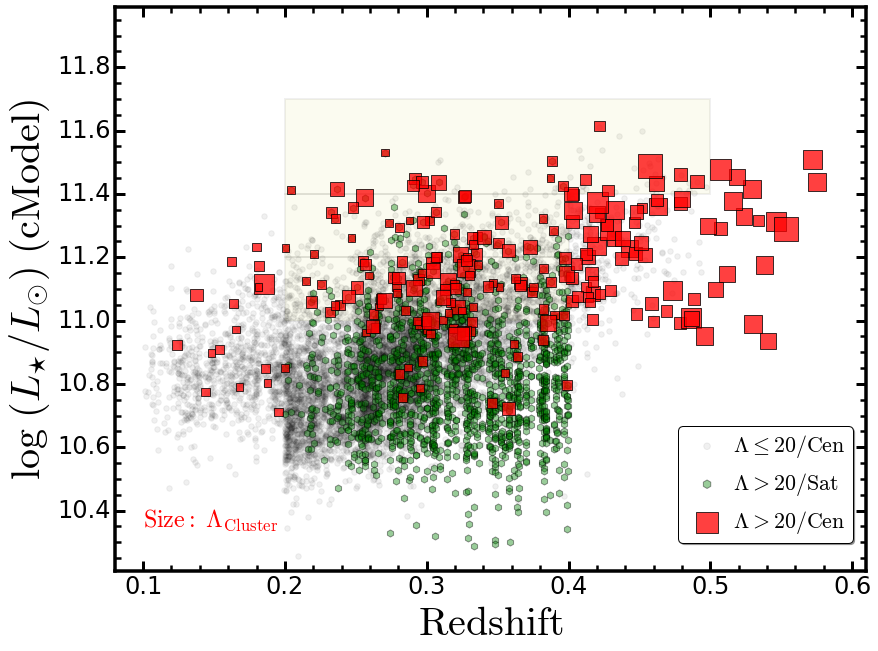

In [77]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], gamaTab['lumI_kC_cmodel'], s=30.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], memTab['lumI_kC_cmodel'], s=50.0, marker='h',
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], bcgTab['lumI_kC_cmodel'], 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{cModel})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_cmodel.png', dpi=230)

### Using the SBP luminosity within 120 Kpc

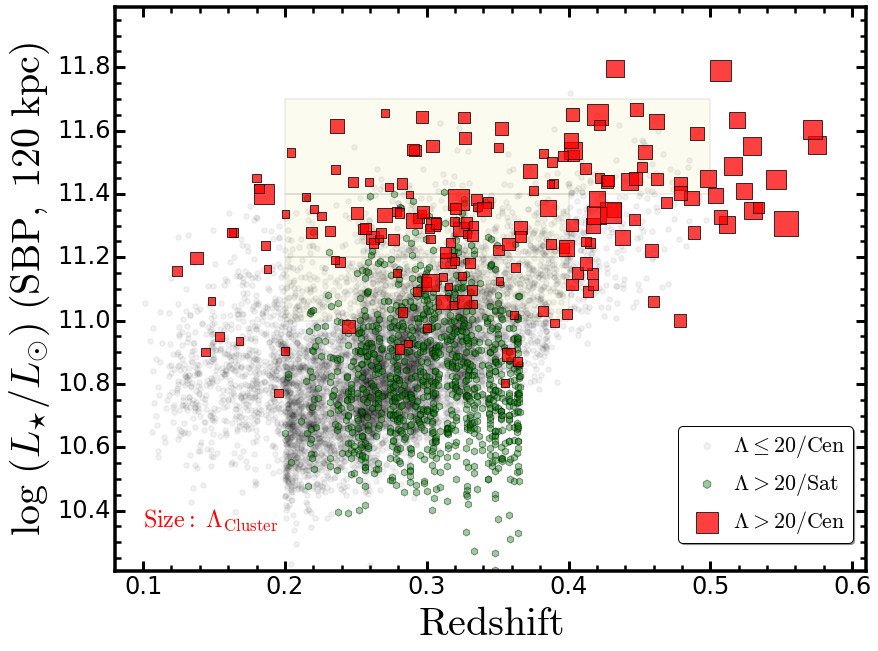

In [78]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], (gamaTab['lum_120'] + (gamaTab['KCORRECT_c_I'] / 2.5)), 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], (memTab['lum_120'] + (memTab['KCORRECT_c_I'] / 2.5)), 
            s=50.0, marker='h', alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], (bcgTab['lum_120'] + (bcgTab['KCORRECT_c_I'] / 2.5)), 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{SBP,\ 120\ kpc})$', size=40)

# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_120.png', dpi=230)

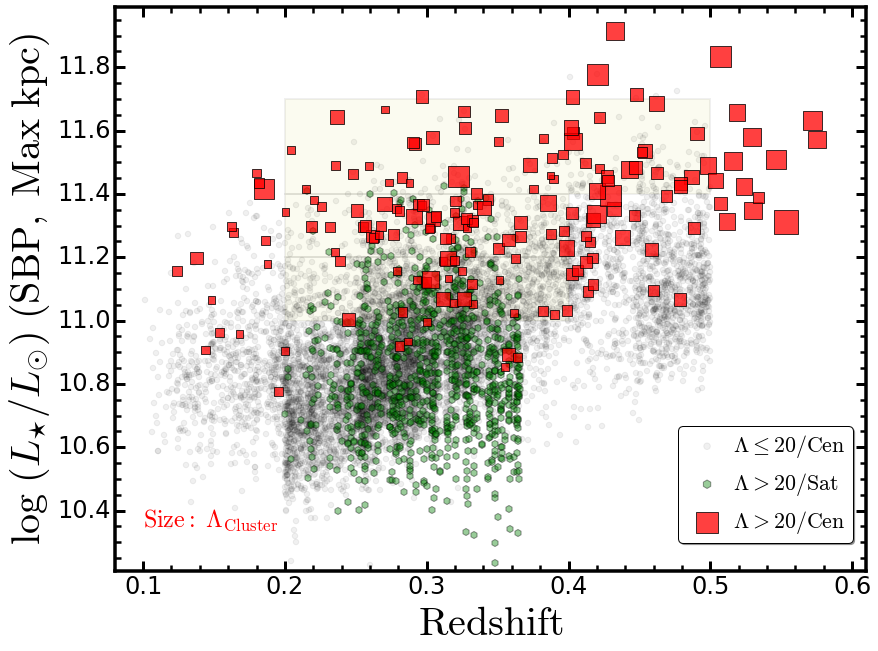

In [143]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], (gamaTab['lum_max'] + (gamaTab['KCORRECT_c_I'] / 2.5)), 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], (memTab['lum_max'] + (memTab['KCORRECT_c_I'] / 2.5)), 
            s=50.0, marker='h', alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], (bcgTab['lum_max'] + (bcgTab['KCORRECT_c_I'] / 2.5)), 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{SBP,\ Max\ kpc})$', size=40)

# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_max.png', dpi=230)

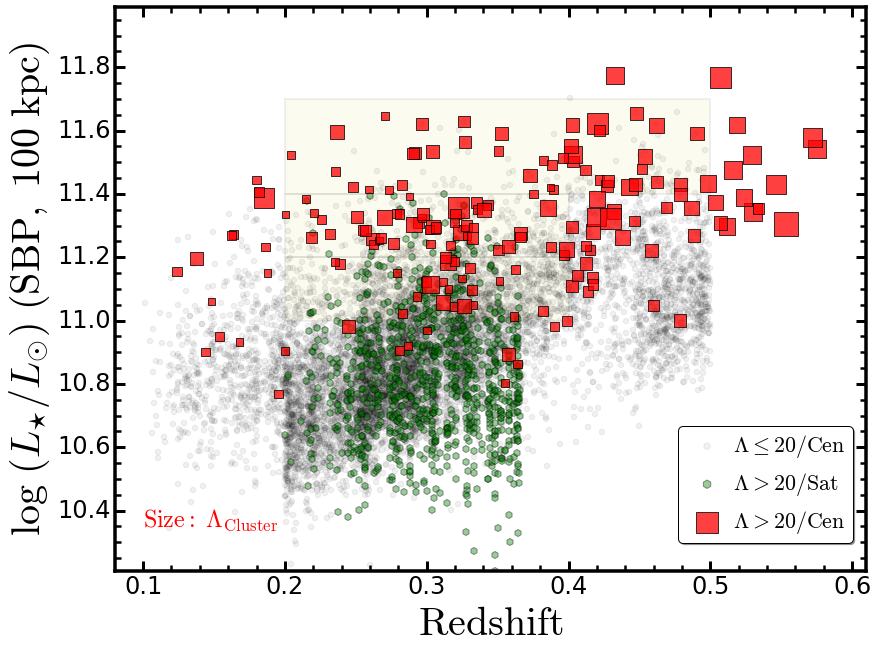

In [142]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], (gamaTab['lum_100'] + (gamaTab['KCORRECT_c_I'] / 2.5)), 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], (memTab['lum_100'] + (memTab['KCORRECT_c_I'] / 2.5)), 
            s=50.0, marker='h', alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], (bcgTab['lum_100'] + (bcgTab['KCORRECT_c_I'] / 2.5)), 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{SBP,\ 100\ kpc})$', size=40)

# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_100.png', dpi=230)

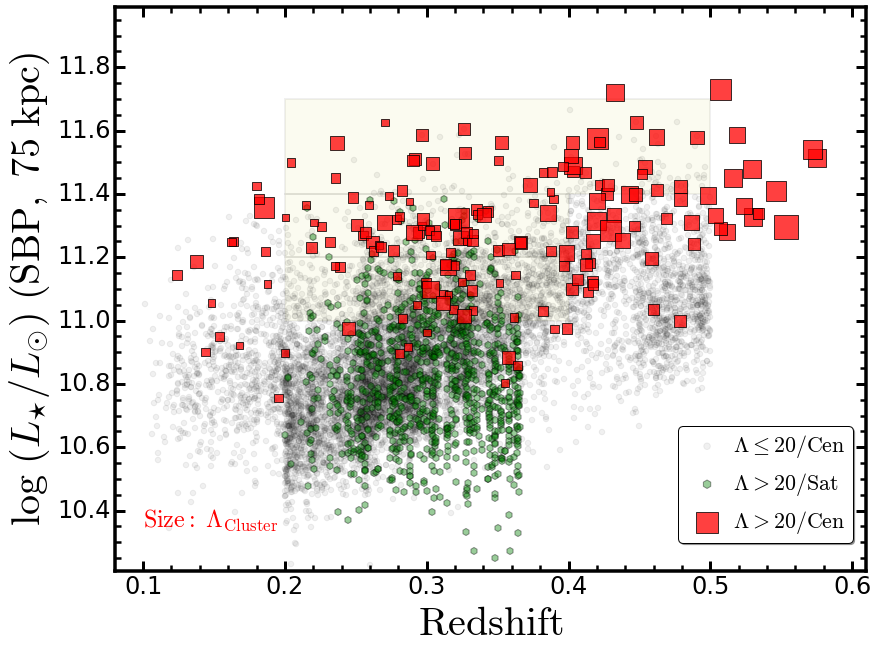

In [141]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], (gamaTab['lum_75'] + (gamaTab['KCORRECT_c_I'] / 2.5)), 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], (memTab['lum_75'] + (memTab['KCORRECT_c_I'] / 2.5)), 
            s=50.0, marker='h', alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], (bcgTab['lum_75'] + (bcgTab['KCORRECT_c_I'] / 2.5)), 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{SBP,\ 75\ kpc})$', size=40)

# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_75.png', dpi=230)

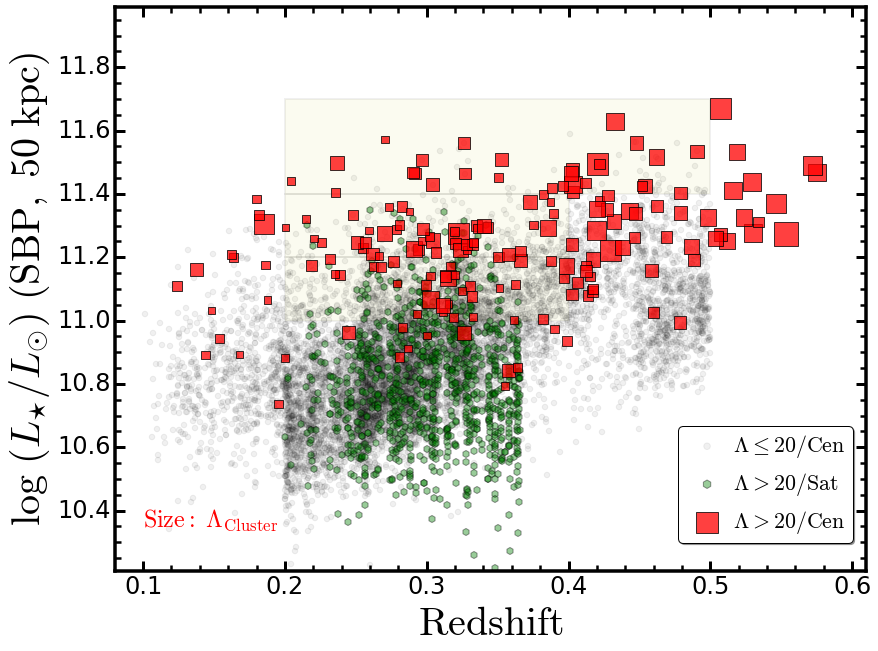

In [140]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], (gamaTab['lum_50'] + (gamaTab['KCORRECT_c_I'] / 2.5)), 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], (memTab['lum_50'] + (memTab['KCORRECT_c_I'] / 2.5)), 
            s=50.0, marker='h', alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], (bcgTab['lum_50'] + (bcgTab['KCORRECT_c_I'] / 2.5)), 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{SBP,\ 50\ kpc})$', size=40)

# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_50.png', dpi=230)

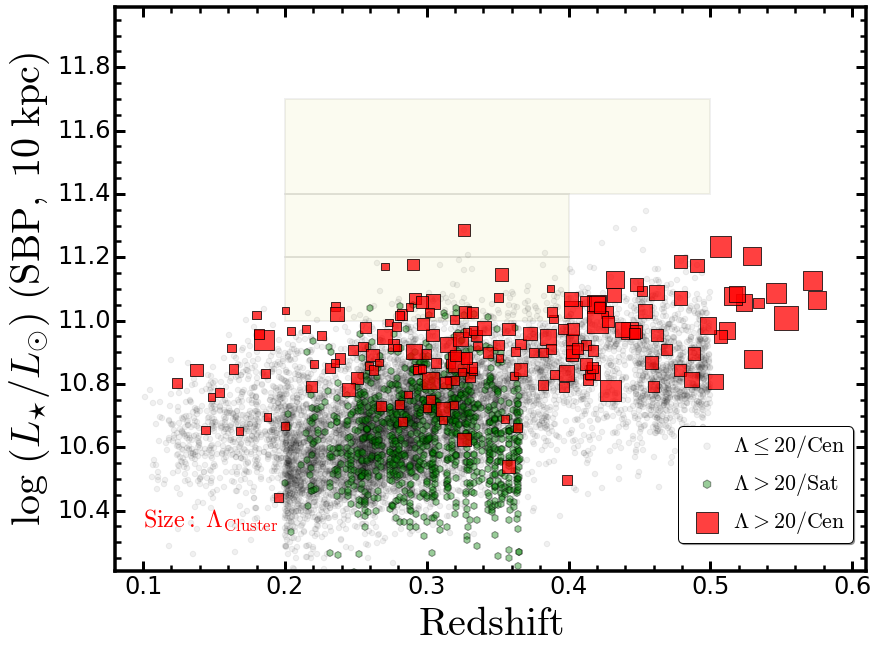

In [139]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, lumBin1], zBinW1, lumBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, lumBin2], zBinW2, lumBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, lumBin3], zBinW3, lumBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], (gamaTab['lum_10'] + (gamaTab['KCORRECT_c_I'] / 2.5)), 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], (memTab['lum_10'] + (memTab['KCORRECT_c_I'] / 2.5)), 
            s=50.0, marker='h', alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], (bcgTab['lum_10'] + (bcgTab['KCORRECT_c_I'] / 2.5)), 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (L_{\star}/L_{\odot})\ (\mathrm{SBP,\ 10\ kpc})$', size=40)

# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.21, 11.99)

ax1.legend(loc=(0.75, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.10, 10.35, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_z_lumI_10.png', dpi=230)

## Redshift - Stellar Mass Function

In [136]:
# Redshift Bins
z0 = 0.2
zBinW1, zBinW2, zBinW3 = 0.2, 0.2, 0.3

# Luminosity Bins
massBin1, massBin2, massBin3 = 11.4, 11.6, 11.8
massBinW1, massBinW2, massBinW3 = 0.2, 0.2, 0.3

### cModel Stellar Mass

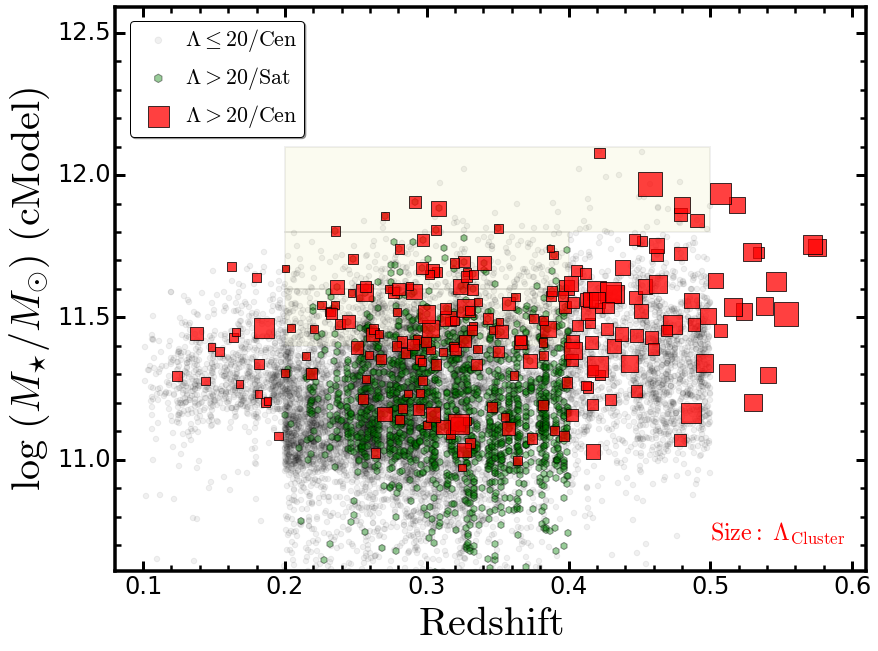

In [138]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
ax1.scatter(gamaTab['Z'], gamaTab['lumI_cmodel'] + gamaTab['logm2lI_C'], 
            s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], memTab['lumI_cmodel'] + memTab['logm2lI_C'], 
            s=50.0, marker='h', alpha=0.40, c='g', 
            label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], bcgTab['lumI_cmodel'] + bcgTab['logm2lI_C'], 
            alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{cModel})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend(loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_cmodel.png', dpi=230)

### GAMA Stellar Mass

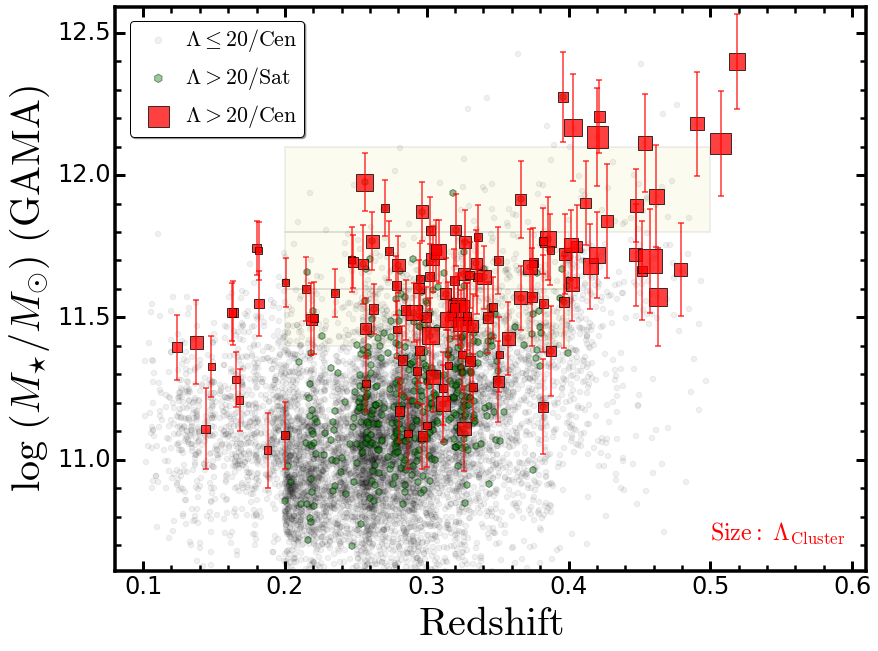

In [146]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['logms_gama'] + np.log10(gamaTab['fluxscale_gama']), 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['logms_gama'] + np.log10(memTab['fluxscale_gama']), 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['logms_gama'] + np.log10(bcgTab['fluxscale_gama']), 
             yerr=bcgTab['logms_err_gama'], ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['logms_gama'] + np.log10(bcgTab['fluxscale_gama']), 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{GAMA})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_gama.png', dpi=230)

### 1-D Integrated Mass

In [118]:
bcgMErr = np.sqrt(((bcgTab['MSTAR'] - bcgTab['MSTAR_c']) / 4.0 ** 2.0) + (bcgTab['MSTAR_ERR'] ** 2.0))
bcgMErr = np.asarray(bcgMErr)
bcgMErr[bcgMErr <= 0.05] = 0.15

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in sqrt
  if __name__ == '__main__':


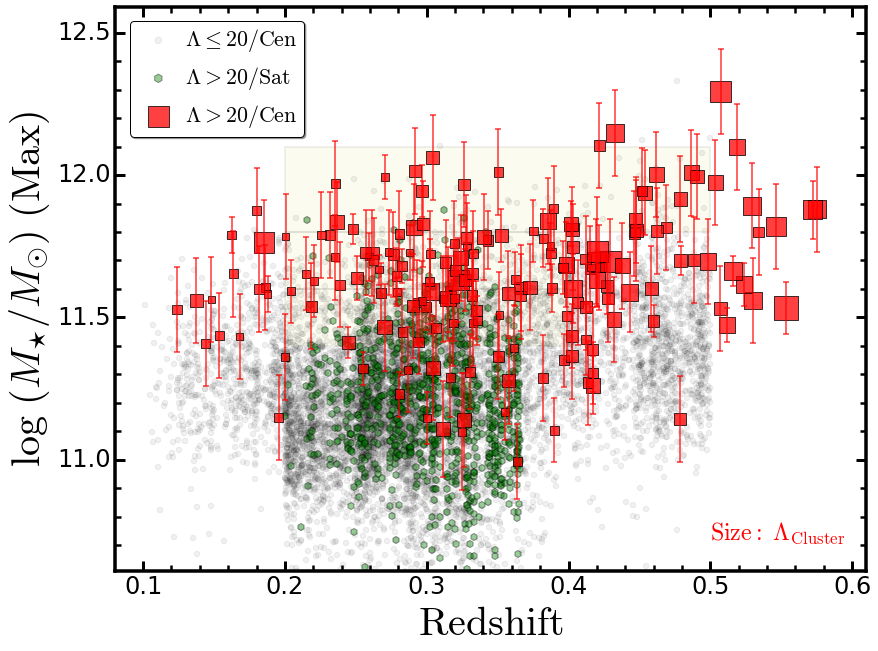

In [147]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['mmax_c'], 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['mmax_c'], 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['mmax_c'], 
             yerr=bcgMErr, ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['mmax_c'], 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{Max})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_max.png', dpi=230)

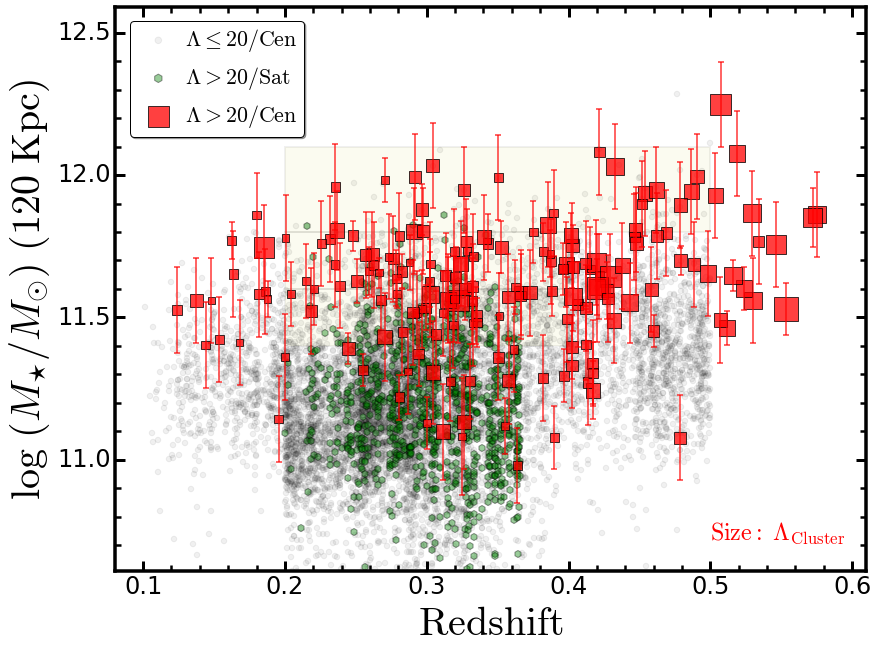

In [112]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['m120_c'], 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['m120_c'], 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['m120_c'], 
             yerr=bcgMErr, ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['m120_c'], 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{120\ Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_lumI_120.png', dpi=230)

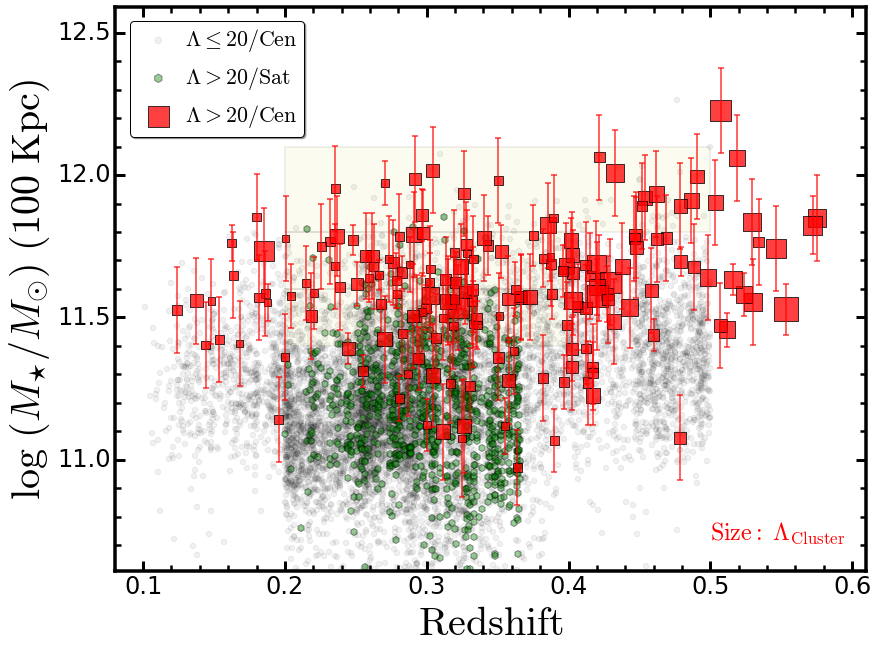

In [148]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['m100_c'], 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['m100_c'], 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['m100_c'], 
             yerr=bcgMErr, ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['m100_c'], 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{100\ Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_100.png', dpi=230)

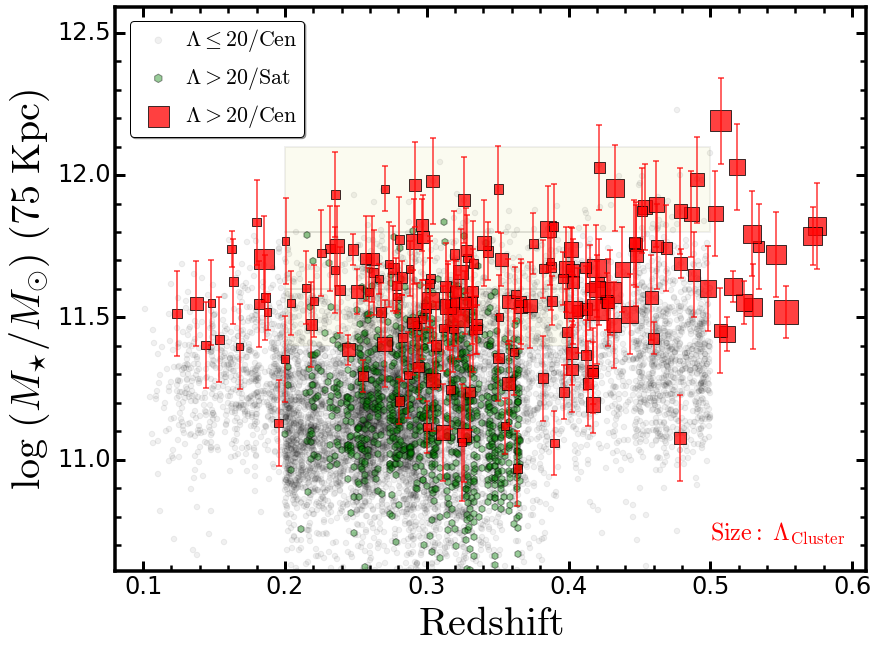

In [149]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['m75_c'], 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['m75_c'], 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['m75_c'], 
             yerr=bcgMErr, ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['m75_c'], 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{75\ Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_75.png', dpi=230)

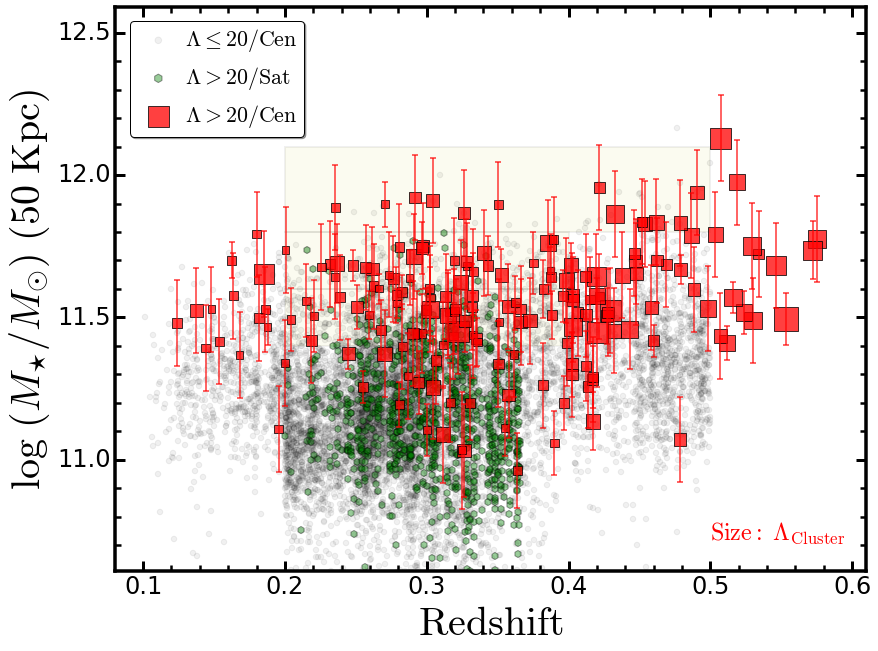

In [150]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['lum_50'] + gamaTab['logm2lI_C'], 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['lum_50'] + memTab['logm2lI_C'], 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['lum_50'] + bcgTab['logm2lI_C'], 
             yerr=bcgMErr, ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['lum_50'] + bcgTab['logm2lI_C'], 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{50\ Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_50.png', dpi=230)

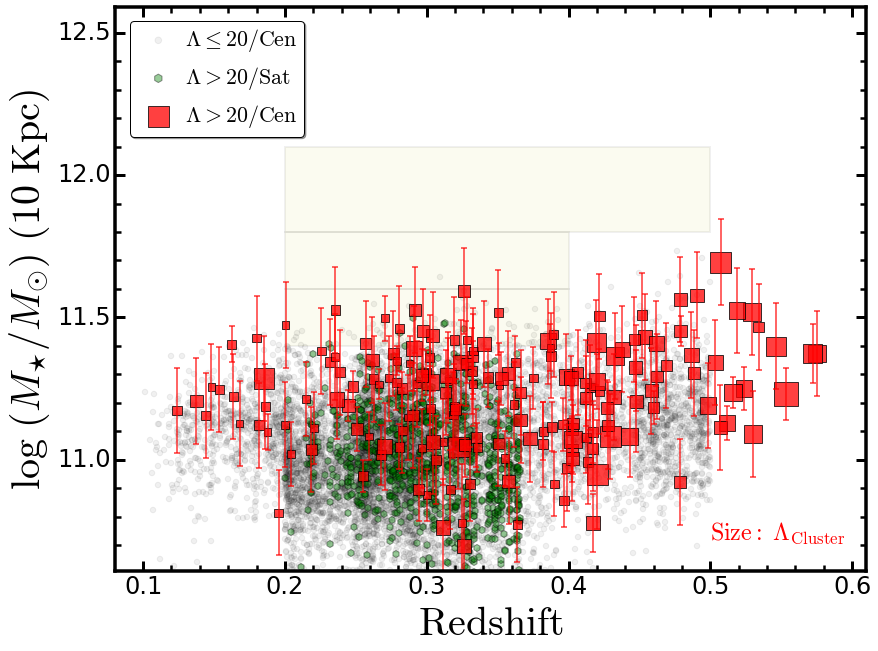

In [151]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.11, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Luminosity bins
regL1 = mpatches.Rectangle([z0, massBin1], zBinW1, massBinW1, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL1)
regL2 = mpatches.Rectangle([z0, massBin2], zBinW2, massBinW2, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL2)
regL3 = mpatches.Rectangle([z0, massBin3], zBinW3, massBinW3, ec="k", 
                           facecolor="y", linewidth=2.0, 
                           linestyle='solid', alpha=0.06, zorder=0)
ax1.add_patch(regL3)

#ax1.axvline(0.2, linewidth=2, c='k', alpha=0.2)
#ax1.axvline(0.4, linewidth=2, c='k', alpha=0.2)

# Matched ones 
a = ax1.scatter(gamaTab['Z'], gamaTab['m10_c'], 
                s=30.0, alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

b = ax1.scatter(memTab['Z'], memTab['m10_c'], 
                s=50.0, marker='h', alpha=0.40, c='g', 
                label='$\Lambda > 20\mathrm{/Sat}$')

ax1.errorbar(bcgTab['Z'], bcgTab['m10_c'], 
             yerr=bcgMErr, ecolor='r', capthick=2, fmt='.', 
             linewidth=2.0, color='none', label=None, alpha=0.6)
c= ax1.scatter(bcgTab['Z'], bcgTab['m10_c'], 
               alpha=0.75, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
               marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 10) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{10\ Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.08, 0.61)
ax1.set_ylim(10.61, 12.59)

ax1.legend([a, b, c], ['$\Lambda \leq 20\mathrm{/Cen}$', 
                       '$\Lambda > 20\mathrm{/Sat}$',
                       '$\Lambda > 20\mathrm{/Cen}$'],
           loc=(0.02, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.50, 10.72, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_z_mass_10.png', dpi=230)

## Stellar Mass Difference 

### Difference caused by SSP models

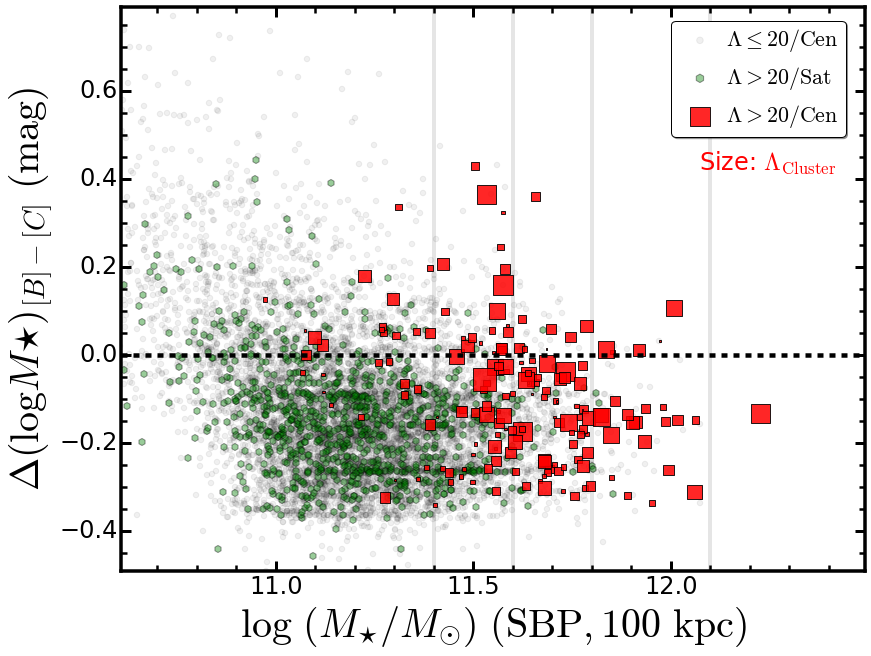

In [221]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.132, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')
ax1.axvline(11.40, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.60, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.80, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(12.10, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)

# Matched ones 
ax1.scatter(gamaTab['lum_100'] + gamaTab['logm2lI_C'], 
            gamaTab['logm2lI_B'] - gamaTab['logm2lI_C'], s=30.0, 
            alpha=0.06, c='k', 
            label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['lum_100'] + memTab['logm2lI_C'], 
            memTab['logm2lI_B'] - memTab['logm2lI_C'], s=50.0, 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$',
            marker='h')

ax1.scatter(bcgTab['lum_100'] + bcgTab['logm2lI_C'], 
            bcgTab['logm2lI_B'] - bcgTab['logm2lI_C'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP,}100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\Delta(\log M{\star})_{[B] - [C]}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.61, 12.49)
ax1.set_ylim(-0.49, 0.79)

ax1.legend(loc=(0.74, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(12.07, 0.42, 'Size: ${\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logMc_diffBC.png', dpi=230)

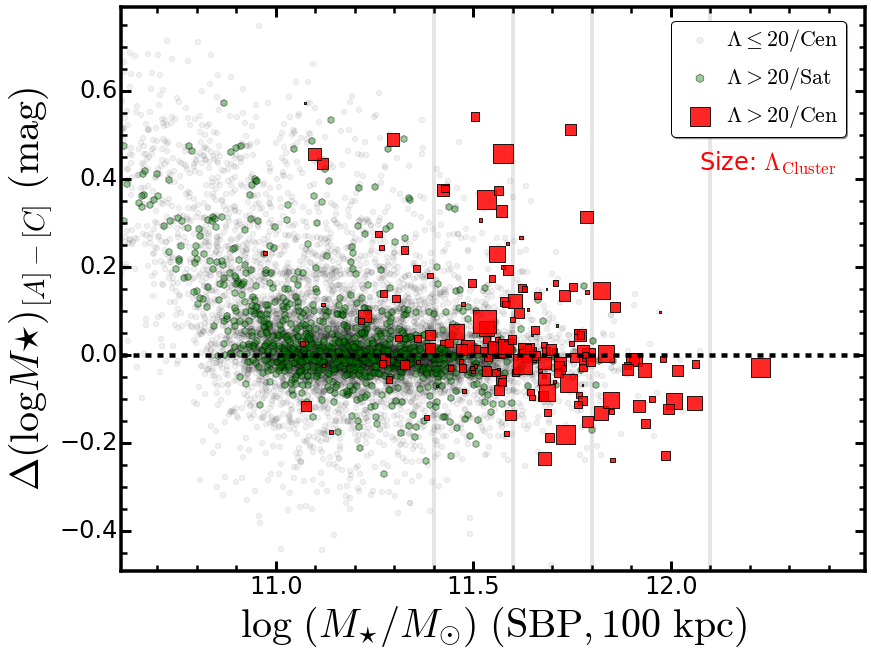

In [222]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.132, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')
ax1.axvline(11.40, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.60, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.80, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(12.10, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)

# Matched ones 
ax1.scatter(gamaTab['lum_100'] + gamaTab['logm2lI_C'], 
            gamaTab['logm2lI_A'] - gamaTab['logm2lI_C'], s=30.0, 
            alpha=0.06, c='k', 
            label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['lum_100'] + memTab['logm2lI_C'], 
            memTab['logm2lI_A'] - memTab['logm2lI_C'], s=50.0, 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$',
            marker='h')

ax1.scatter(bcgTab['lum_100'] + bcgTab['logm2lI_C'], 
            bcgTab['logm2lI_A'] - bcgTab['logm2lI_C'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP,}100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\Delta(\log M{\star})_{[A] - [C]}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.61, 12.49)
ax1.set_ylim(-0.49, 0.79)

ax1.legend(loc=(0.74, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(12.07, 0.42, 'Size: ${\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logMc_diffAC.png', dpi=230)

## Difference between different stellar mass

In [229]:
### Fancy one 

# definitions for the axes
left, width    = 0.12, 0.69
right          = left + width 
bottom, height = 0.12, 0.86
bottom_h = left_h = left + width + 0.02
recScat = [left,   bottom, width, height]
recHist = [right,  bottom,  0.18, height]

In [224]:
# "Complete" sample

## C1: lum100: model C
gamaC1 = gamaTab[(gamaTab['Z'] >= 0.20) & (gamaTab['Z'] <= 0.40) &
                 (gamaTab['lum_100'] + gamaTab['logm2lI_C'] >= 11.4)]
memC1 = memTab[(memTab['Z'] >= 0.20) & (memTab['Z'] <= 0.40) &
               (memTab['lum_100'] + memTab['logm2lI_C'] >= 11.4)]
bcgC1 = bcgTab[(bcgTab['Z'] >= 0.10) & (bcgTab['Z'] <= 0.40) & 
               (bcgTab['lum_100'] + bcgTab['logm2lI_C'] >= 11.4)]

### Mass Difference between cModel

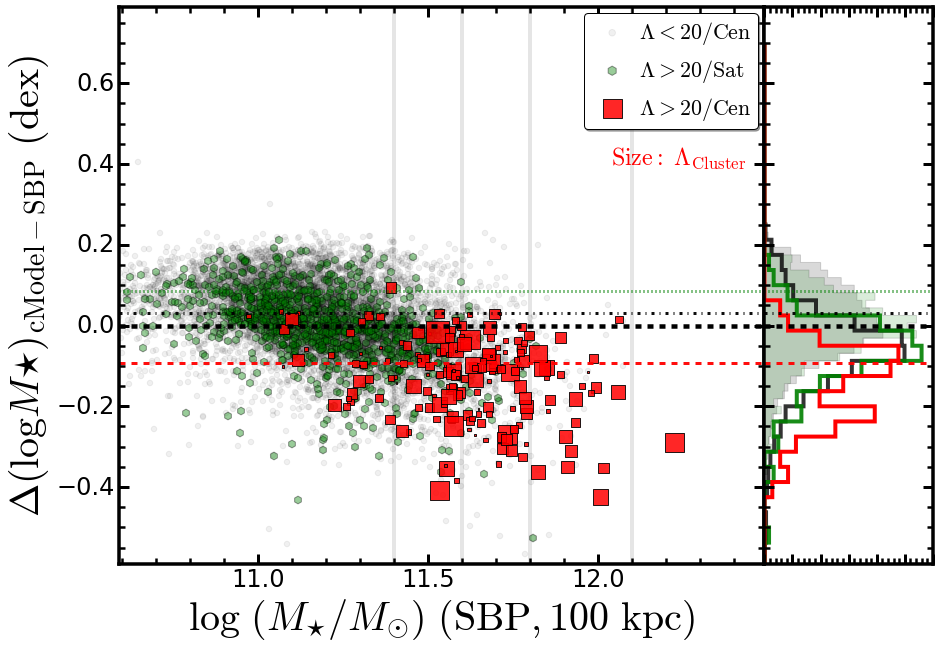

In [230]:
fig = plt.figure(figsize=(13, 9))
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# SBP v.s. (cModel - SBP)
# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')
ax1.axvline(11.40, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.60, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.80, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(12.10, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)

# Matched ones 
ax1.scatter(gamaTab['lum_100'] + gamaTab['logm2lI_C'], 
            gamaTab['lumI_cmodel'] - gamaTab['lum_100'], s=30.0, 
            alpha=0.06, c='k', label='$\Lambda < 20\mathrm{/Cen}$')

ax1.scatter(memTab['lum_100'] + memTab['logm2lI_C'], 
            memTab['lumI_cmodel'] - memTab['lum_100'], s=60.0, 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$', marker='h')

ax1.scatter(bcgTab['lum_100'] + bcgTab['logm2lI_C'], 
            bcgTab['lumI_cmodel'] - bcgTab['lum_100'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\Delta(\log M{\star})_{\mathrm{cModel - SBP}}\ (\mathrm{dex})$', size=40)
# Axis limits
ax1.set_xlim(10.59, 12.49)
ax1.set_ylim(-0.59, 0.79)

ax1.legend(loc=(0.72, 0.78), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(12.04, 0.4, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

# Color bar 
#cax = fig.add_axes([0.46, 0.88, 0.3, 0.05]) 
#cb = plt.colorbar(p, orientation="horizontal", cax=cax)
#cb.ax.set_xlabel(r'$(g-r)_{cmodel}$ (mag)', fontsize=20)

# Horizontal line 
ax1.axhline(np.nanmedian(gamaTab['lumI_cmodel'] - gamaTab['lum_100']), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax1.axhline(np.nanmedian(memTab['lumI_cmodel'] - memTab['lum_100']), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax1.axhline(np.nanmedian(bcgTab['lumI_cmodel'] - bcgTab['lum_100']), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')


# ---------------------------------------------------------------------------
# Histogram 
n, bins, patches=ax2.hist((gamaTab['lumI_cmodel'] - gamaTab['lum_100']), 
                          bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='k', alpha=0.15, normed=1)
n, bins, patches=ax2.hist((memTab['lumI_cmodel'] - memTab['lum_100']), 
                          bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='g', alpha=0.15, normed=1)

n, bins, patches=ax2.hist((gamaC1['lumI_cmodel'] - gamaC1['lum_100']), 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='k', alpha=0.80, normed=1, linewidth=4.0)

n, bins, patches=ax2.hist((memC1['lumI_cmodel'] - memC1['lum_100']), 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='g', alpha=0.90, normed=1, linewidth=4.0)

n, bins, patches=ax2.hist((bcgC1['lumI_cmodel'] - bcgC1['lum_100']), 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='r', alpha=1.0, normed=1, linewidth=4.0)

ax2.set_ylim(ax1.get_ylim())

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()

#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
    
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

ax2.axhline(0.0, linewidth=4.5, linestyle='--', c='k')

# Horizontal line 
ax2.axhline(np.nanmedian(gamaTab['lumI_cmodel'] - gamaTab['lum_100']), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax2.axhline(np.nanmedian(memTab['lumI_cmodel'] - memTab['lum_100']), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax2.axhline(np.nanmedian(bcgTab['lumI_cmodel'] - bcgTab['lum_100']), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('../figure/hscMassive_logm_diffCmod.png', dpi=230)

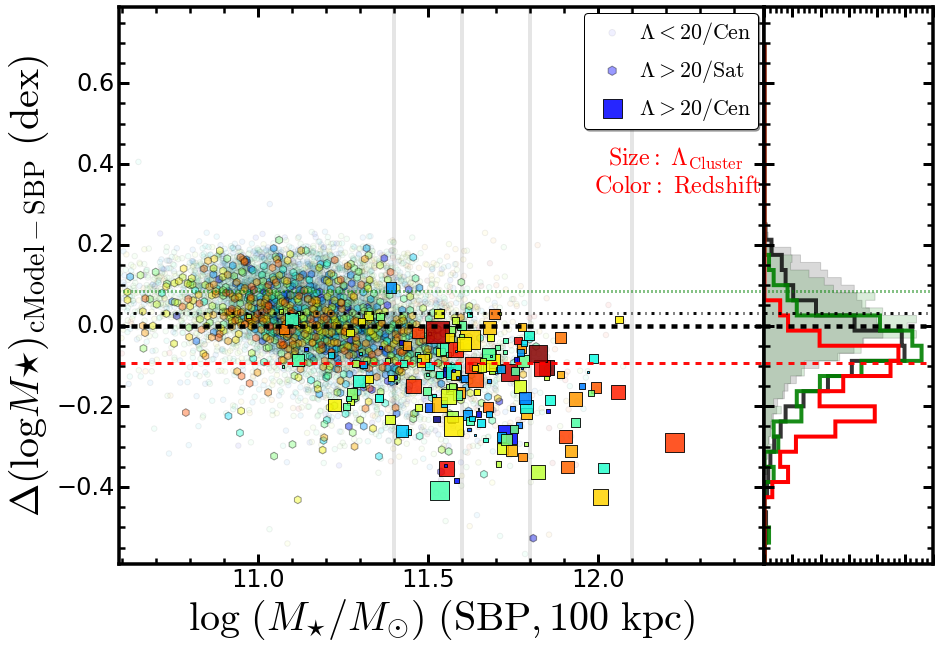

In [231]:
fig = plt.figure(figsize=(13, 9))
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# SBP v.s. (cModel - SBP)
# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')
ax1.axvline(11.40, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.60, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.80, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(12.10, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)

# Matched ones 
ax1.scatter(gamaTab['lum_100'] + gamaTab['logm2lI_C'], 
            gamaTab['lumI_cmodel'] - gamaTab['lum_100'], s=30.0, 
            alpha=0.06, c=gamaTab['Z'], label='$\Lambda < 20\mathrm{/Cen}$')

ax1.scatter(memTab['lum_100'] + memTab['logm2lI_C'], 
            memTab['lumI_cmodel'] - memTab['lum_100'], s=60.0, 
            alpha=0.40, c=memTab['Z'], label='$\Lambda > 20\mathrm{/Sat}$', 
            marker='h')

ax1.scatter(bcgTab['lum_100'] + bcgTab['logm2lI_C'], 
            bcgTab['lumI_cmodel'] - bcgTab['lum_100'], 
            alpha=0.85, c=bcgTab['Z'], label='$\Lambda > 20\mathrm{/Cen}$', 
            marker='s', s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()

#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)

#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
    
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\Delta(\log M{\star})_{\mathrm{cModel - SBP}}\ (\mathrm{dex})$', size=40)

# Axis limits
ax1.set_xlim(10.59, 12.49)
ax1.set_ylim(-0.59, 0.79)

ax1.legend(loc=(0.72, 0.78), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(12.03, 0.4, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')
ax1.text(11.988, 0.33, '$\mathrm{Color:}\ \mathrm{Redshift}}$',
         fontsize=24, color='r')

# Color bar 
#cax = fig.add_axes([0.46, 0.88, 0.3, 0.05]) 
#cb = plt.colorbar(p, orientation="horizontal", cax=cax)
#cb.ax.set_xlabel(r'$(g-r)_{cmodel}$ (mag)', fontsize=20)

# Horizontal line 
ax1.axhline(np.nanmedian(gamaTab['lumI_cmodel'] - gamaTab['lum_100']), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax1.axhline(np.nanmedian(memTab['lumI_cmodel'] - memTab['lum_100']), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax1.axhline(np.nanmedian(bcgTab['lumI_cmodel'] - bcgTab['lum_100']), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')


# ---------------------------------------------------------------------------
# Histogram 
n, bins, patches=ax2.hist((gamaTab['lumI_cmodel'] - gamaTab['lum_100']), 
                          bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='k', alpha=0.15, normed=1)
n, bins, patches=ax2.hist((memTab['lumI_cmodel'] - memTab['lum_100']), 
                          bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='g', alpha=0.15, normed=1)

n, bins, patches=ax2.hist((gamaC1['lumI_cmodel'] - gamaC1['lum_100']), 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='k', alpha=0.80, normed=1, linewidth=4.0)

n, bins, patches=ax2.hist((memC1['lumI_cmodel'] - memC1['lum_100']), 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='g', alpha=0.90, normed=1, linewidth=4.0)

n, bins, patches=ax2.hist((bcgC1['lumI_cmodel'] - bcgC1['lum_100']), 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='r', alpha=1.0, normed=1, linewidth=4.0)

ax2.set_ylim(ax1.get_ylim())

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()

#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
    
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

ax2.axhline(0.0, linewidth=4.5, linestyle='--', c='k')

# Horizontal line 
ax2.axhline(np.nanmedian(gamaTab['lumI_cmodel'] - gamaTab['lum_100']), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax2.axhline(np.nanmedian(memTab['lumI_cmodel'] - memTab['lum_100']), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax2.axhline(np.nanmedian(bcgTab['lumI_cmodel'] - bcgTab['lum_100']), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('../figure/hscMassive_logm_diffCmod_z.png', dpi=230)

### Mass Difference with GAMA ones

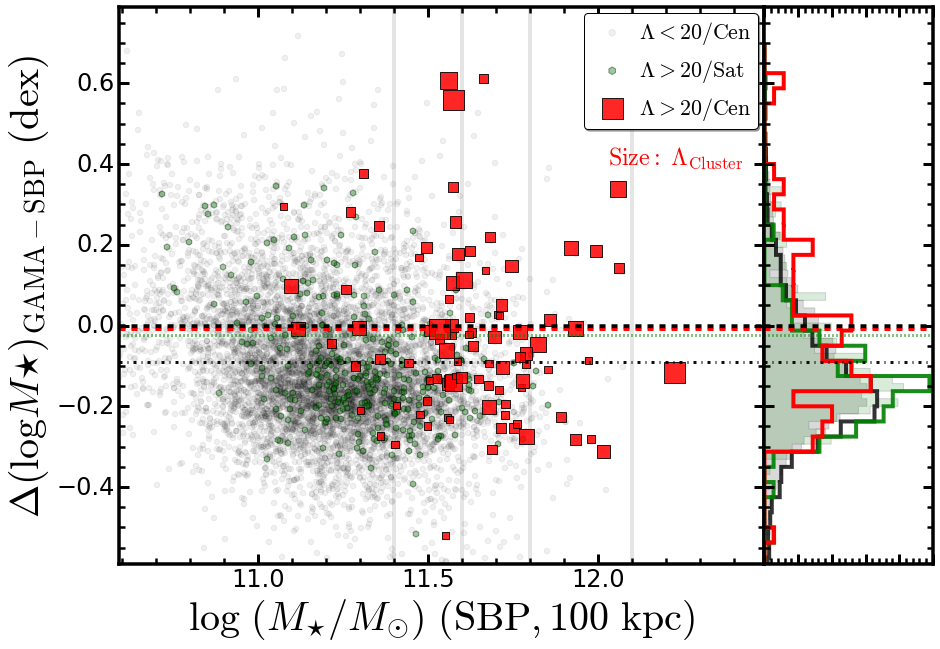

In [232]:
fig = plt.figure(figsize=(13, 9))
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# SBP v.s. (cModel - SBP)
# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')
ax1.axvline(11.40, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.60, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.80, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(12.10, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)

# Matched ones 
gamaDiff = (gamaTab['logms_gama'] + np.log10(gamaTab['fluxscale_gama']) - 
            gamaTab['lum_100'] - gamaTab['logm2lI_C']) 
ax1.scatter(gamaTab['lum_100'] + gamaTab['logm2lI_C'], gamaDiff, s=30.0, 
            alpha=0.06, c='k', label='$\Lambda < 20\mathrm{/Cen}$')

memDiff = (memTab['logms_gama'] + np.log10(memTab['fluxscale_gama']) - 
           memTab['lum_100'] - memTab['logm2lI_C']) 
ax1.scatter(memTab['lum_100'] + memTab['logm2lI_C'], memDiff, s=40.0, 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$', 
            marker='h')

bcgDiff = (bcgTab['logms_gama'] + np.log10(bcgTab['fluxscale_gama']) - 
           bcgTab['lum_100'] - bcgTab['logm2lI_C']) 
ax1.scatter(bcgTab['lum_100'] + bcgTab['logm2lI_C'], bcgDiff, 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 12) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP},100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\Delta(\log M{\star})_{\mathrm{GAMA - SBP}}\ (\mathrm{dex})$', size=40)

# Axis limits
ax1.set_xlim(10.59, 12.49)
ax1.set_ylim(-0.59, 0.79)

ax1.legend(loc=(0.72, 0.78), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(12.03, 0.4, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

# Color bar 
#cax = fig.add_axes([0.46, 0.88, 0.3, 0.05]) 
#cb = plt.colorbar(p, orientation="horizontal", cax=cax)
#cb.ax.set_xlabel(r'$(g-r)_{cmodel}$ (mag)', fontsize=20)

# Horizontal line 
ax1.axhline(np.nanmedian(gamaDiff), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax1.axhline(np.nanmedian(memDiff), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax1.axhline(np.nanmedian(bcgDiff), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')


# ---------------------------------------------------------------------------
# Histogram 
n, bins, patches=ax2.hist(gamaDiff, bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='k', alpha=0.15, normed=1)
n, bins, patches=ax2.hist(memDiff, bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='g', alpha=0.15, normed=1)

gamaM = gamaTab['lum_100'] + gamaTab['logm2lI_C']
n, bins, patches=ax2.hist(gamaDiff[gamaM >= 11.40], 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='k', alpha=0.80, normed=1, linewidth=4.0)
memM = memTab['lum_100'] + memTab['logm2lI_C']
n, bins, patches=ax2.hist(memDiff[memM >= 11.40], 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='g', alpha=0.90, normed=1, linewidth=4.0)

n, bins, patches=ax2.hist(bcgDiff, bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='r', alpha=1.0, normed=1, linewidth=4.0)

ax2.set_ylim(ax1.get_ylim())

# Axes setup
# Minor Ticks on 
ax2.minorticks_on()

#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

ax2.axhline(0.0, linewidth=4.5, linestyle='--', c='k')

# Horizontal line 
ax2.axhline(np.nanmedian(gamaDiff), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax2.axhline(np.nanmedian(memDiff), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax2.axhline(np.nanmedian(bcgDiff), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('../figure/hscMassive_logm_diffGama.png', dpi=230)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:130: RuntimeWarning: invalid value encountered in greater_equal
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:132: RuntimeWarning: invalid value encountered in less_equal


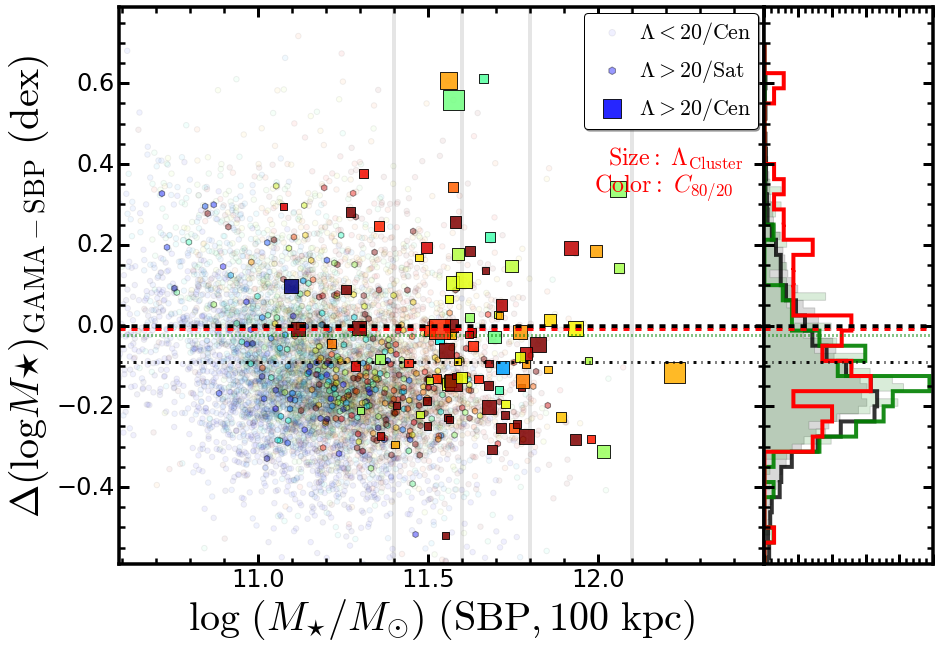

In [233]:
fig = plt.figure(figsize=(13, 9))
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# SBP v.s. (cModel - SBP)
# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')
ax1.axvline(11.40, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.60, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(11.80, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)
ax1.axvline(12.10, linewidth=4.0, linestyle='-', c='k', zorder=0, alpha=0.1)

# Matched ones 
gamaDiff = (gamaTab['logms_gama'] + np.log10(gamaTab['fluxscale_gama']) - 
            gamaTab['lum_100'] - gamaTab['logm2lI_C'])
c82_gama = gamaTab['c82_120']
c82_gama[c82_gama <= 1.0] = np.nan
c82_gama = toColorArr(c82_gama, bottom=3.0, top=10.0)
ax1.scatter(gamaTab['lum_100'] + gamaTab['logm2lI_C'], gamaDiff, s=30.0, 
            alpha=0.06, c=c82_gama, 
            label='$\Lambda < 20\mathrm{/Cen}$')

memDiff = (memTab['logms_gama'] + np.log10(memTab['fluxscale_gama']) - 
           memTab['lum_100'] - memTab['logm2lI_C']) 
c82_mem = memTab['c82_120']
c82_mem[c82_mem <= 1.0] = np.nan
c82_mem = toColorArr(c82_mem, bottom=3.0, top=10.0)
ax1.scatter(memTab['lum_100'] + memTab['logm2lI_C'], memDiff, s=40.0, 
            alpha=0.40, c=c82_mem, 
            label='$\Lambda > 20\mathrm{/Sat}$', marker='h')

bcgDiff = (bcgTab['logms_gama'] + np.log10(bcgTab['fluxscale_gama']) - 
           bcgTab['lum_100'] - bcgTab['logm2lI_C']) 
c82_bcg = bcgTab['c82_120']
c82_bcg[c82_bcg <= 1.0] = np.nan
c82_bcg = toColorArr(c82_bcg, bottom=3.0, top=10.0)
ax1.scatter(bcgTab['lum_100'] + bcgTab['logm2lI_C'], bcgDiff, 
            alpha=0.85, c=c82_bcg, 
            label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 12) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP},100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\Delta(\log M{\star})_{\mathrm{GAMA - SBP}}\ (\mathrm{dex})$', size=40)

# Axis limits
ax1.set_xlim(10.59, 12.49)
ax1.set_ylim(-0.59, 0.79)

ax1.legend(loc=(0.72, 0.78), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(12.03, 0.4, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')
ax1.text(11.988, 0.33, '$\mathrm{Color:}\ C_{80/20}$',
         fontsize=24, color='r')

# Color bar 
#cax = fig.add_axes([0.46, 0.88, 0.3, 0.05]) 
#cb = plt.colorbar(p, orientation="horizontal", cax=cax)
#cb.ax.set_xlabel(r'$(g-r)_{cmodel}$ (mag)', fontsize=20)

# Horizontal line 
ax1.axhline(np.nanmedian(gamaDiff), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax1.axhline(np.nanmedian(memDiff), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax1.axhline(np.nanmedian(bcgDiff), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')


# ---------------------------------------------------------------------------
# Histogram 
n, bins, patches=ax2.hist(gamaDiff, bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='k', alpha=0.15, normed=1)
n, bins, patches=ax2.hist(memDiff, bins=80, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='stepfilled', 
                          color='g', alpha=0.15, normed=1)

gamaM = gamaTab['lum_100'] + gamaTab['logm2lI_C']
n, bins, patches=ax2.hist(gamaDiff[gamaM >= 11.40], 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='k', alpha=0.80, normed=1, linewidth=4.0)
memM = memTab['lum_100'] + memTab['logm2lI_C']
n, bins, patches=ax2.hist(memDiff[memM >= 11.40], 
                          bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='g', alpha=0.90, normed=1, linewidth=4.0)

n, bins, patches=ax2.hist(bcgDiff, bins=40, range=[-0.8, 0.7], 
                          orientation='horizontal', histtype='step', 
                          color='r', alpha=1.0, normed=1, linewidth=4.0)

ax2.set_ylim(ax1.get_ylim())

# Axes setup
# Minor Ticks on 
ax2.minorticks_on()

#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

ax2.axhline(0.0, linewidth=4.5, linestyle='--', c='k')

# Horizontal line 
ax2.axhline(np.nanmedian(gamaDiff), color='k',
            alpha=0.95, linewidth=3.0, linestyle='-.')
ax2.axhline(np.nanmedian(memDiff), color='g',
            alpha=0.95, linewidth=3.0, linestyle=':')
ax2.axhline(np.nanmedian(bcgDiff), color='r',
            alpha=0.95, linewidth=3.0, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('../figure/hscMassive_logm_diffGama_c82.png', dpi=230)

## Comparison of Color

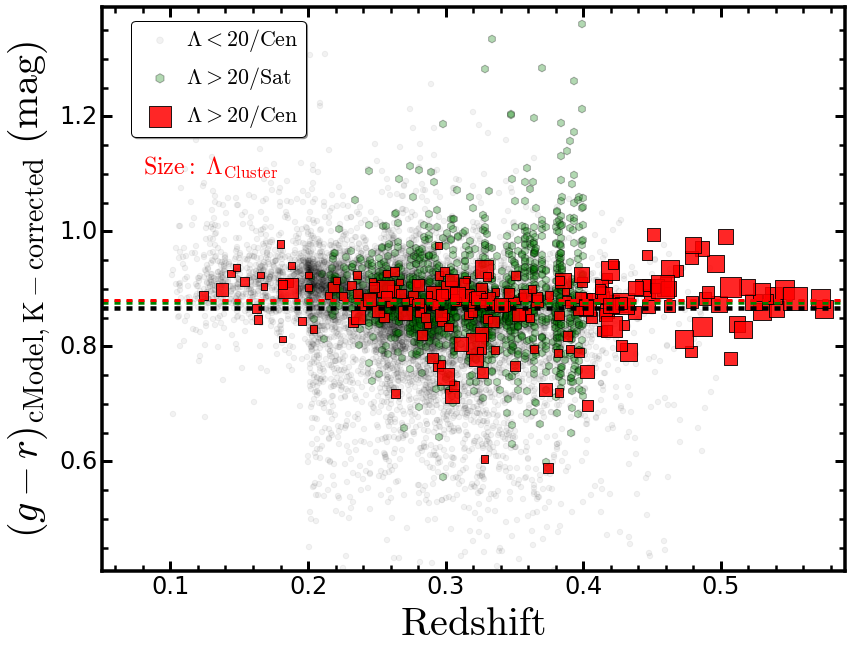

In [234]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['Z'], gamaTab['gr_kC'], s=30.0, 
            alpha=0.05, c='k', label='$\Lambda < 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], memTab['gr_kC'], s=60.0, marker='h',
            alpha=0.30, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], bcgTab['gr_kC'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 12) * 5.2))

# Median color 
ax1.axhline(np.nanmedian(gamaTab['gr_kC']), linewidth=4.5,
            linestyle='--', c='k')
ax1.axhline(np.nanmedian(memTab['gr_kC']), linewidth=4.5,
            linestyle='--', c='g')
ax1.axhline(np.nanmedian(bcgTab['gr_kC']), linewidth=3.0,
            linestyle='--', c='r')

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$(g-r)_{\mathrm{cModel, K-corrected}}\ (\mathrm{mag})$', size=40)

# Axis limits
ax1.set_xlim(0.05, 0.59)
ax1.set_ylim(0.41, 1.39)

ax1.legend(loc=(0.04, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.08, 1.10, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_z_grModC.png', dpi=230)

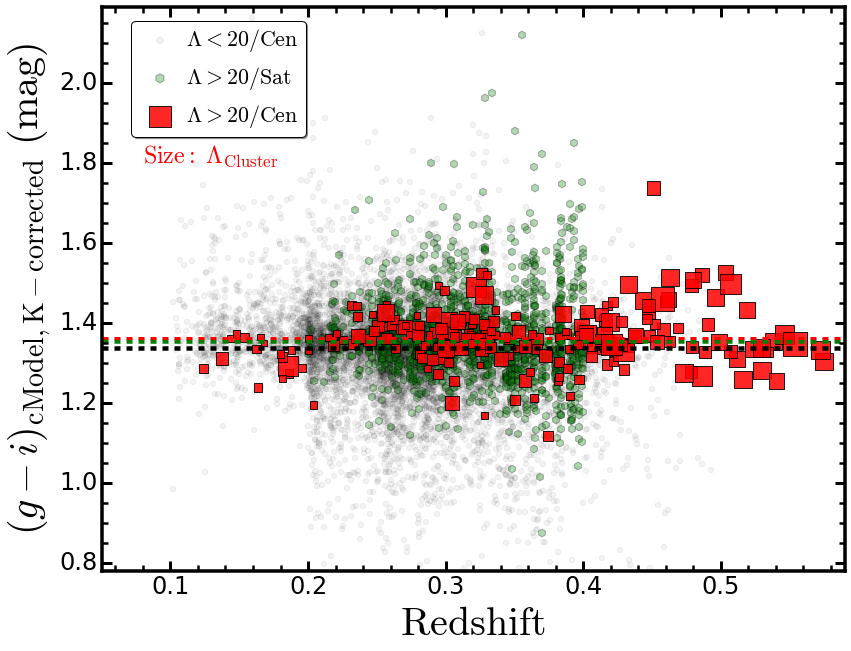

In [235]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['Z'], gamaTab['gi_kC'], s=30.0, 
            alpha=0.05, c='k', label='$\Lambda < 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], memTab['gi_kC'], s=60.0, marker='h',
            alpha=0.30, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], bcgTab['gi_kC'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 12) * 5.2))

# Median color 
ax1.axhline(np.nanmedian(gamaTab['gi_kC']), linewidth=4.5,
            linestyle='--', c='k')
ax1.axhline(np.nanmedian(memTab['gi_kC']), linewidth=4.5,
            linestyle='--', c='g')
ax1.axhline(np.nanmedian(bcgTab['gi_kC']), linewidth=3.0,
            linestyle='--', c='r')

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$(g-i)_{\mathrm{cModel, K-corrected}}\ (\mathrm{mag})$', size=40)

# Axis limits
ax1.set_xlim(0.05, 0.59)
ax1.set_ylim(0.78, 2.19)

ax1.legend(loc=(0.04, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.08, 1.80, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_z_giModC.png', dpi=230)

### Color from GAMA SED

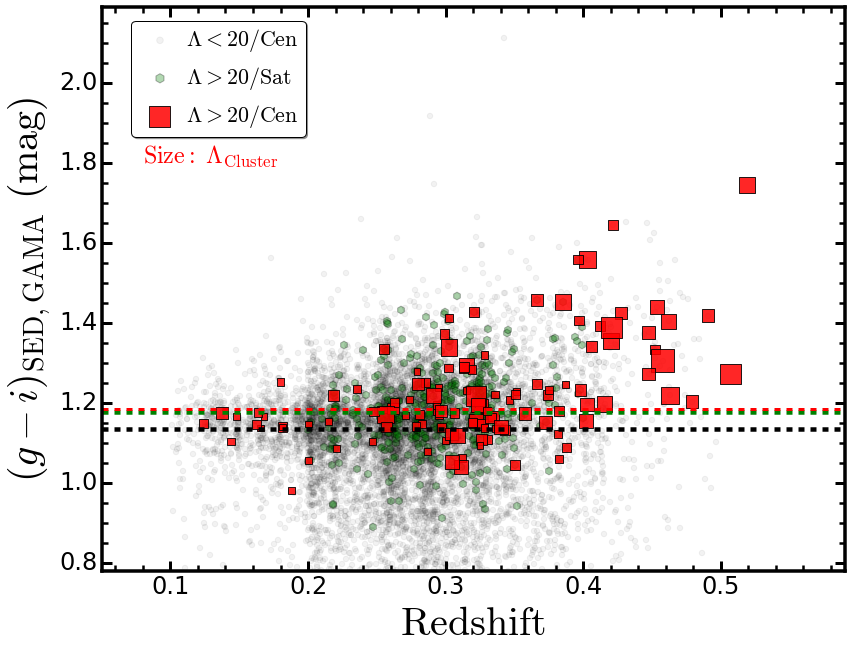

In [236]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['Z'], gamaTab['gi_rest_sed'], s=30.0, 
            alpha=0.05, c='k', label='$\Lambda < 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], memTab['gi_rest_sed'], s=60.0, marker='h',
            alpha=0.30, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], bcgTab['gi_rest_sed'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 12) * 5.2))

# Median color 
ax1.axhline(np.nanmedian(gamaTab['gi_rest_sed']), linewidth=4.5,
            linestyle='--', c='k')
ax1.axhline(np.nanmedian(memTab['gi_rest_sed']), linewidth=4.5,
            linestyle='--', c='g')
ax1.axhline(np.nanmedian(bcgTab['gi_rest_sed']), linewidth=3.0,
            linestyle='--', c='r')

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$(g-i)_{\mathrm{SED, GAMA}}\ (\mathrm{mag})$', size=40)

# Axis limits
ax1.set_xlim(0.05, 0.59)
ax1.set_ylim(0.78, 2.19)

ax1.legend(loc=(0.04, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.08, 1.80, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_z_giGama.png', dpi=230)

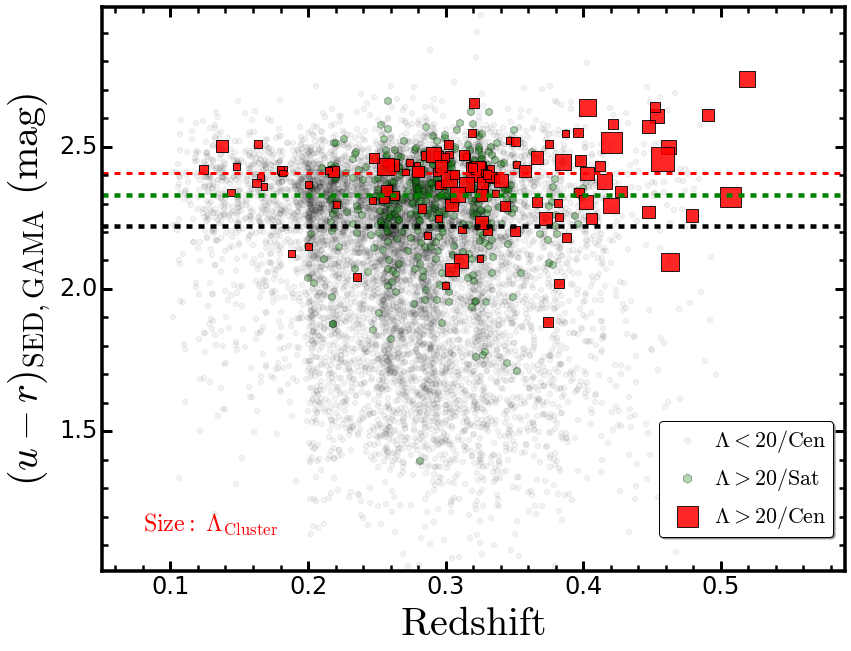

In [237]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['Z'], gamaTab['ur_rest_sed'], s=30.0, 
            alpha=0.05, c='k', label='$\Lambda < 20\mathrm{/Cen}$')

ax1.scatter(memTab['Z'], memTab['ur_rest_sed'], s=60.0, marker='h',
            alpha=0.30, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['Z'], bcgTab['ur_rest_sed'], 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', marker='s',
            s=((bcgTab['LAMBDA_CLUSTER'] - 12) * 5.2))

# Median color 
ax1.axhline(np.nanmedian(gamaTab['ur_rest_sed']), linewidth=4.5,
            linestyle='--', c='k')
ax1.axhline(np.nanmedian(memTab['ur_rest_sed']), linewidth=4.5,
            linestyle='--', c='g')
ax1.axhline(np.nanmedian(bcgTab['ur_rest_sed']), linewidth=3.0,
            linestyle='--', c='r')

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\mathrm{Redshift}$',  size=40)
ax1.set_ylabel('$(u-r)_{\mathrm{SED, GAMA}}\ (\mathrm{mag})$', size=40)

# Axis limits
ax1.set_xlim(0.05, 0.59)
ax1.set_ylim(1.01, 2.99)

ax1.legend(loc=(0.75, 0.06), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.08, 1.15, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_z_urGama.png', dpi=230)

### Color Difference due to different SSP model

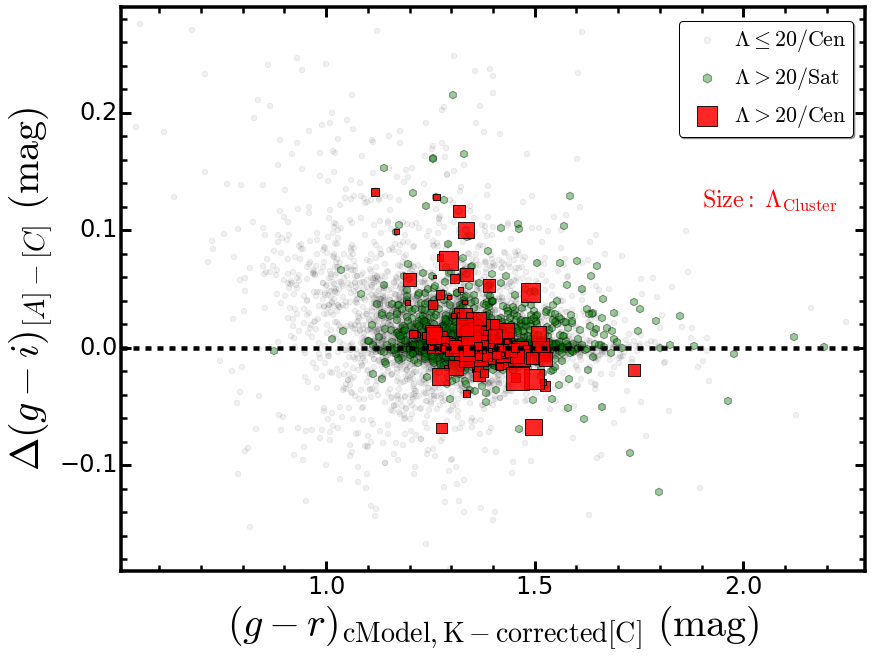

In [274]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.12, 0.12, 0.86, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')

# Matched ones 
ax1.scatter(gamaTab['gi_kC'], gamaTab['gi_kA'] - gamaTab['gi_kC'], s=30.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['gi_kC'], memTab['gi_kA'] - memTab['gi_kC'], s=60.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['gi_kC'], bcgTab['gi_kA'] - bcgTab['gi_kC'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 18) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(g-r)_{\mathrm{cModel, K-corrected [C]}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('$\Delta(g-i)_{[A] - [C]}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(0.51, 2.29)
ax1.set_ylim(-0.19, 0.29)

ax1.legend(loc=(0.75, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(1.90, 0.12, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_gi_giDiffAC.png', dpi=230)

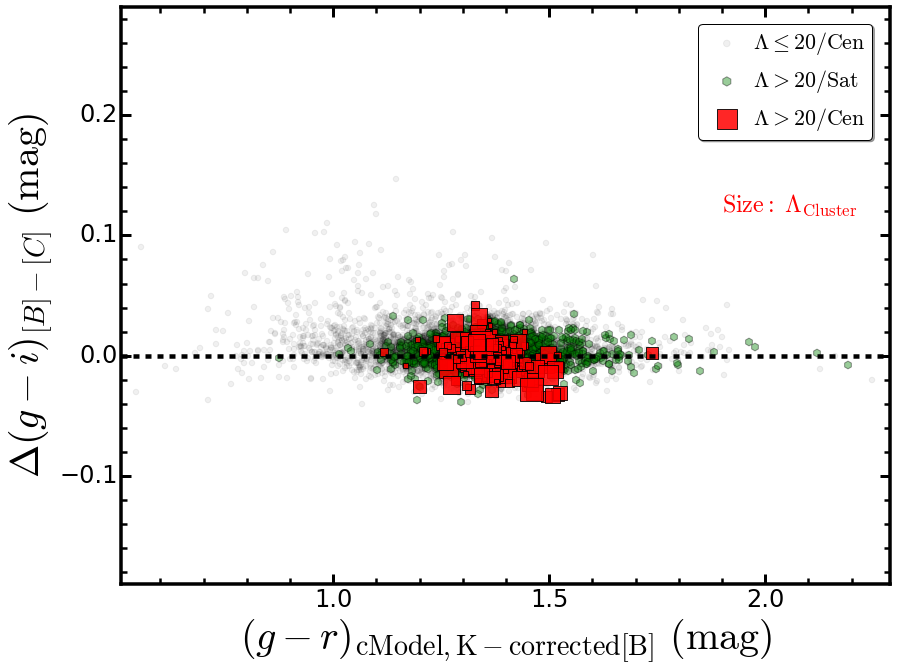

In [273]:
fig = plt.figure(figsize=(12, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot
ax1.axhline(0.0, linewidth=4.5, linestyle='--', c='k')

# Matched ones 
ax1.scatter(gamaTab['gi_kC'], gamaTab['gi_kB'] - gamaTab['gi_kC'], s=30.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['gi_kC'], memTab['gi_kB'] - memTab['gi_kC'], s=60.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['gi_kC'], bcgTab['gi_kB'] - bcgTab['gi_kC'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 18) * 5.2))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(g-r)_{\mathrm{cModel, K-corrected [B]}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('$\Delta(g-i)_{[B] - [C]}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(0.51, 2.29)
ax1.set_ylim(-0.19, 0.29)

ax1.legend(loc=(0.75, 0.77), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(1.90, 0.12, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_gi_giDiffBC.png', dpi=230)

### Color - Color Comparison

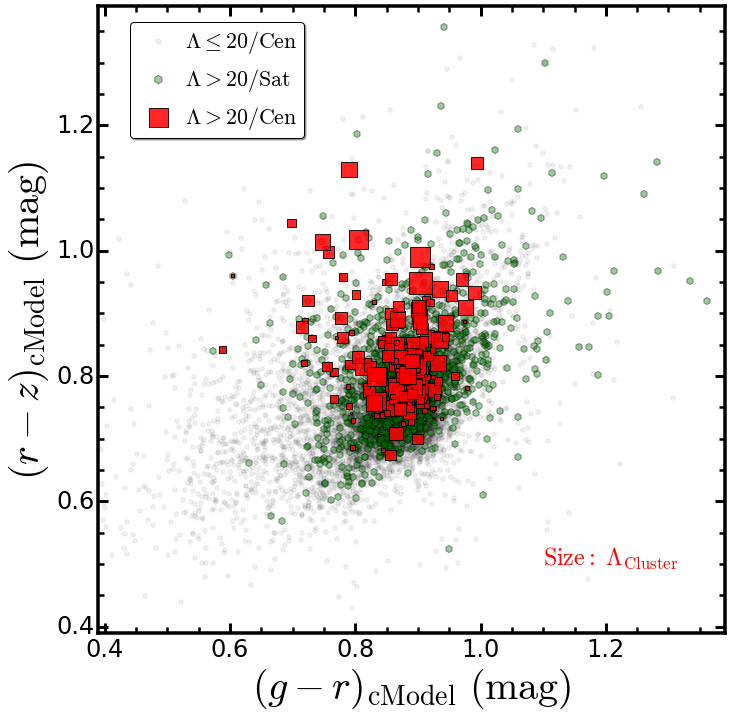

In [290]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['gr_kC'], gamaTab['gz_kC'] - gamaTab['gr_kC'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['gr_kC'], memTab['gz_kC'] - memTab['gr_kC'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['gr_kC'], bcgTab['gz_kC'] - bcgTab['gr_kC'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(g-r)_{\mathrm{cModel}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('$(r-z)_{\mathrm{cModel}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(0.39, 1.39)
ax1.set_ylim(0.39, 1.39)

ax1.legend(loc=(0.05, 0.79), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(1.10, 0.5, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_gr_rz.png', dpi=230)

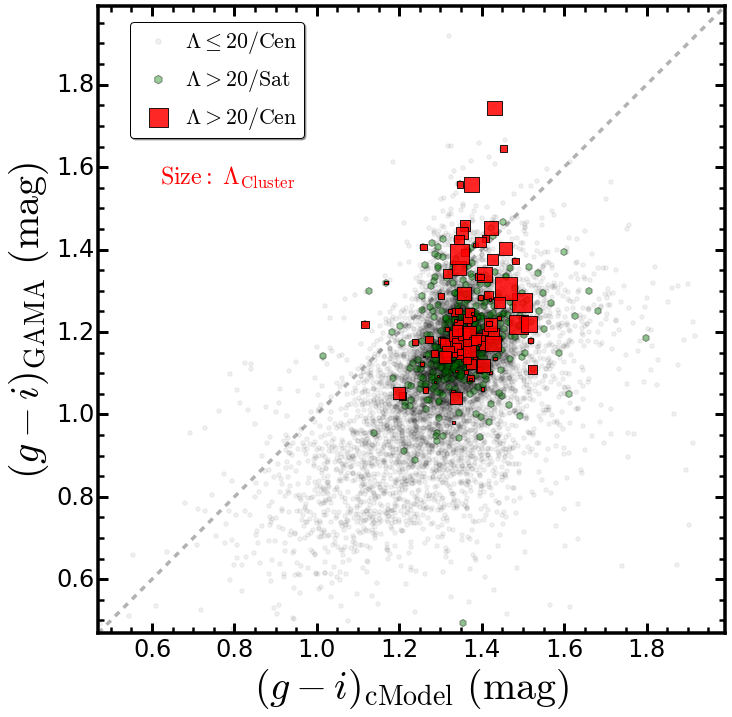

In [289]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

xx = np.arange(0.0, 2.0, 0.01)
ax1.plot(xx, xx, linestyle='--', linewidth=3.5, c='k', alpha=0.3,
         zorder=0)

# Matched ones 
ax1.scatter(gamaTab['gi_kC'], gamaTab['gi_rest_sed'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['gi_kC'], memTab['gi_rest_sed'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['gi_kC'], bcgTab['gi_rest_sed'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(g-i)_{\mathrm{cModel}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('$(g-i)_{\mathrm{GAMA}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(0.47, 1.99)
ax1.set_ylim(0.47, 1.99)

ax1.legend(loc=(0.05, 0.79), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.62, 1.56, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_giHsc_giGama.png', dpi=230)

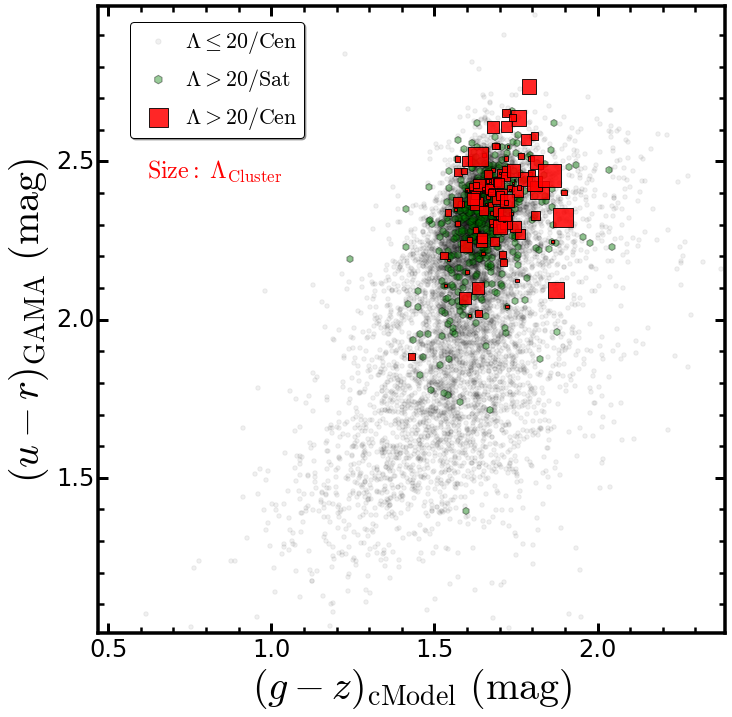

In [288]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['gz_kC'], gamaTab['ur_rest_sed'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['gz_kC'], memTab['ur_rest_sed'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['gz_kC'], bcgTab['ur_rest_sed'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(g-z)_{\mathrm{cModel}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('$(u-r)_{\mathrm{GAMA}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(0.47, 2.39)
ax1.set_ylim(1.01, 2.99)

ax1.legend(loc=(0.05, 0.79), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.62, 2.45, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_gzHsc_urGama.png', dpi=230)

### Stellar Mass Color Relation 

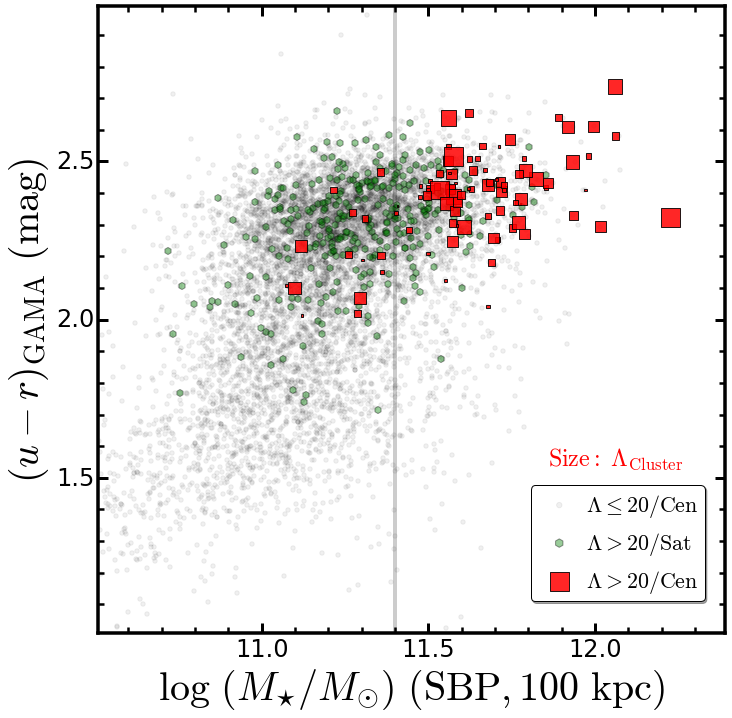

In [287]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='k', linestyle='-', linewidth=4.0, alpha=0.2,
            zorder=0)

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['ur_rest_sed'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['ur_rest_sed'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['ur_rest_sed'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$(u-r)_{\mathrm{GAMA}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(1.01, 2.99)

ax1.legend(loc=(0.69, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.86, 1.54, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logm_urGama.png', dpi=230)

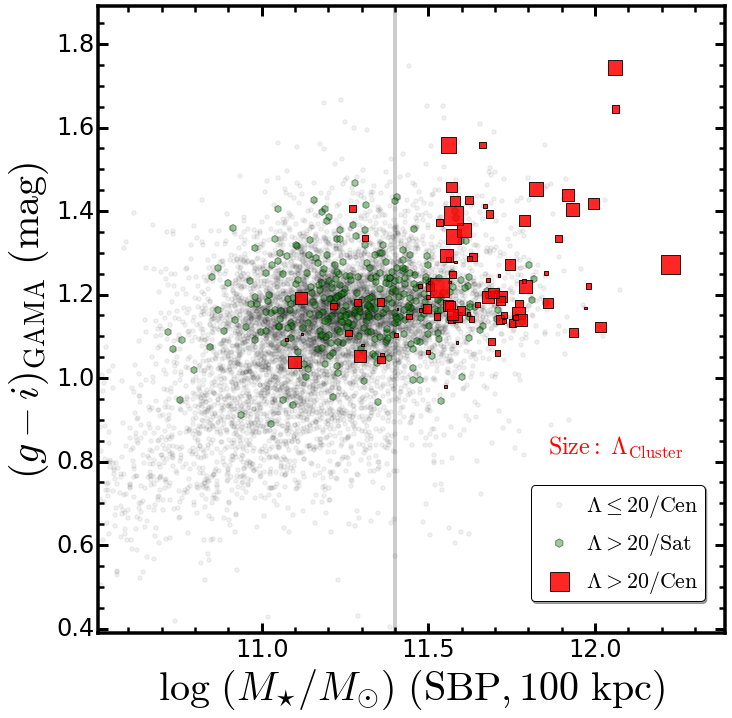

In [286]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='k', linestyle='-', linewidth=4.0, alpha=0.2,
            zorder=0)

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['gi_rest_sed'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['gi_rest_sed'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['gi_rest_sed'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$(g-i)_{\mathrm{GAMA}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(0.39, 1.89)

ax1.legend(loc=(0.69, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.86, 0.82, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logm_giGama.png', dpi=230)

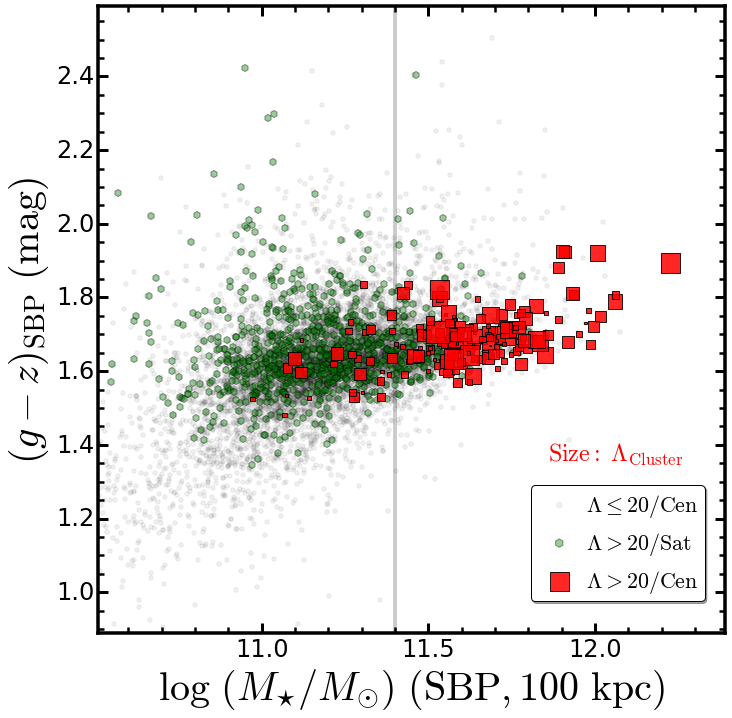

In [285]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='k', linestyle='-', linewidth=4.0, alpha=0.2,
            zorder=0)

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['gz_kC'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['gz_kC'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['gz_kC'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$(g-z)_{\mathrm{SBP}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(0.89, 2.59)

ax1.legend(loc=(0.69, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.86, 1.36, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logm_gz.png', dpi=230)

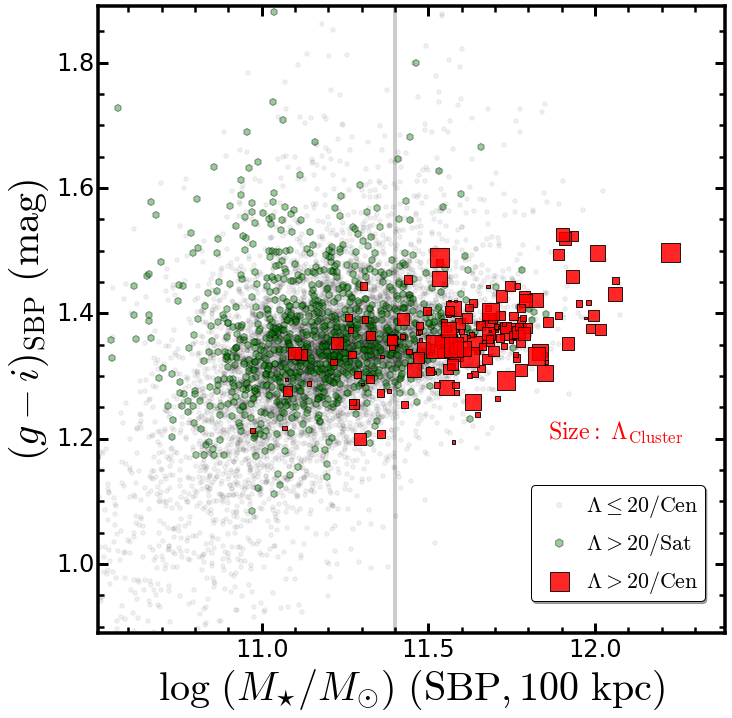

In [291]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='k', linestyle='-', linewidth=4.0, alpha=0.2,
            zorder=0)

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['gi_kC'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['gi_kC'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['gi_kC'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$(g-i)_{\mathrm{SBP}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(0.89, 1.89)

ax1.legend(loc=(0.69, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.86, 1.20, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logm_gi.png', dpi=230)

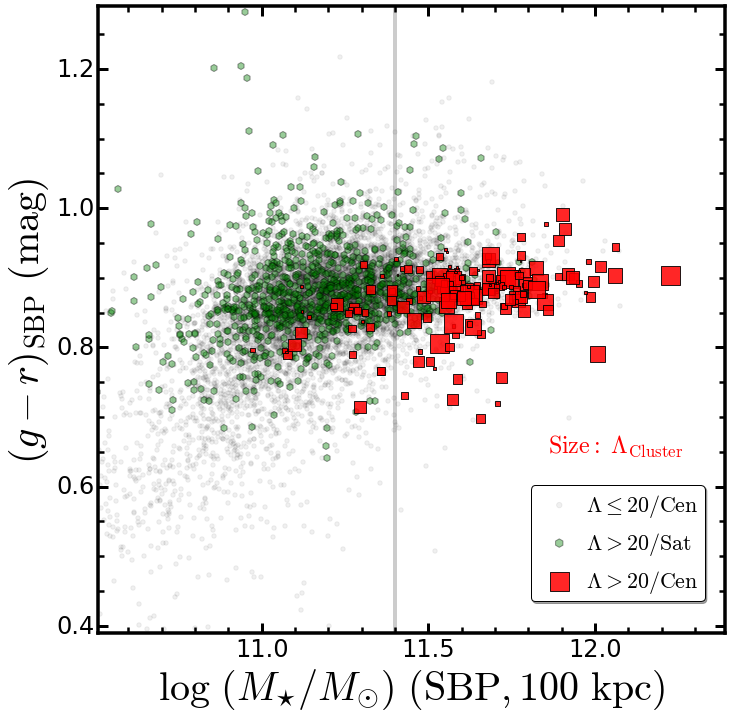

In [295]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='k', linestyle='-', linewidth=4.0, alpha=0.2,
            zorder=0)

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['gr_kC'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['gr_kC'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['gr_kC'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$(g-r)_{\mathrm{SBP}}\ (\mathrm{mag})$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(0.39, 1.29)

ax1.legend(loc=(0.69, 0.05), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.86, 0.65, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logm_gr.png', dpi=230)

## Relations about concentration index 

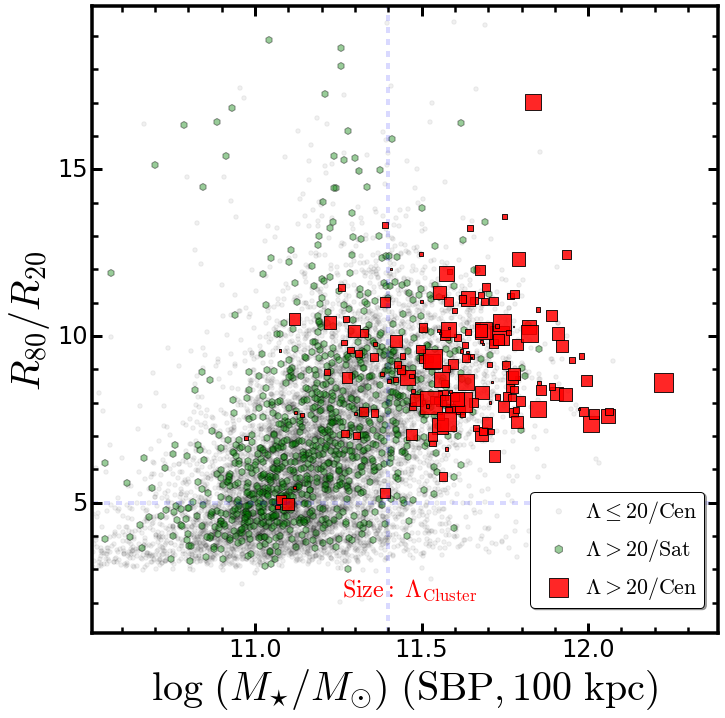

In [327]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)
ax1.axhline(5.0, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['c82_120'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['c82_120'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['c82_120'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('${R_{80}}/{R_{20}}$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(1.1, 19.89)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.26, 2.20, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

fig.savefig('../figure/hscMassive_logm_c82.png', dpi=230)

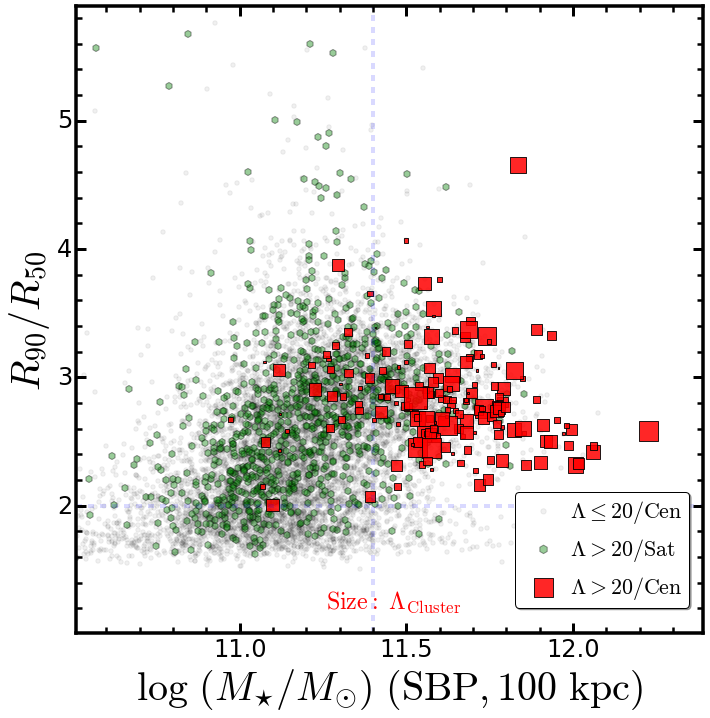

In [326]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['m100_c'], gamaTab['r90_120'] / gamaTab['r50_120'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['m100_c'], memTab['r90_120'] / memTab['r50_120'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['m100_c'], bcgTab['r90_120'] / bcgTab['r50_120'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('${R_{90}}/{R_{50}}$', size=40)
# Axis limits
ax1.set_xlim(10.51, 12.39)
ax1.set_ylim(1.01, 5.89)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.26, 1.20, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)
ax1.axhline(2.0, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

fig.savefig('../figure/hscMassive_logm_c95.png', dpi=230)

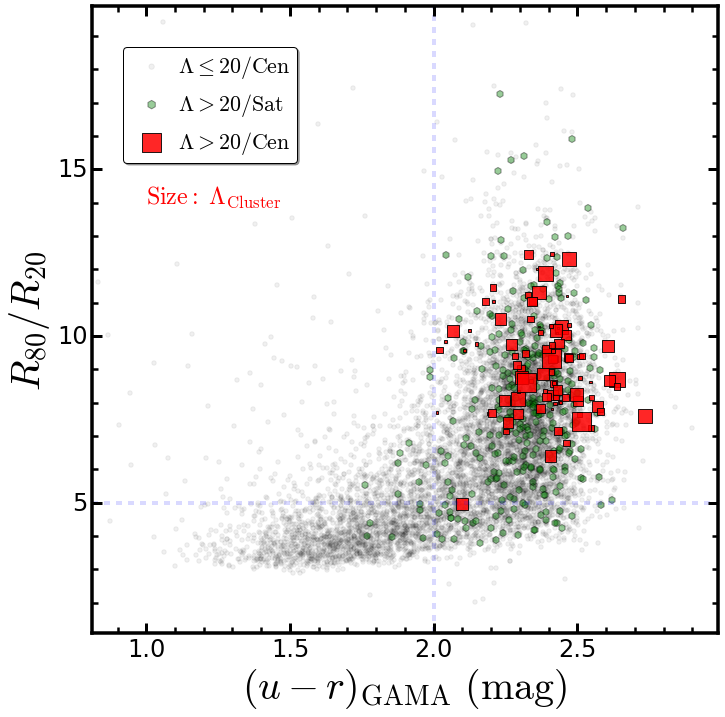

In [328]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='k', linestyle='-', linewidth=4.0, alpha=0.2,
            zorder=0)

# Matched ones 
ax1.scatter(gamaTab['ur_rest_sed'], gamaTab['c82_120'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['ur_rest_sed'], memTab['c82_120'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['ur_rest_sed'], bcgTab['c82_120'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(u-r)_{\mathrm{GAMA}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('${R_{80}}/{R_{20}}$', size=40)
# Axis limits
ax1.set_xlim(0.81, 2.99)
ax1.set_ylim(1.1, 19.89)

ax1.legend(loc=(0.05, 0.75), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(1.00, 14.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

ax1.axvline(2.0, c='b', alpha=0.15, linestyle='--', linewidth=4.0)
ax1.axhline(5.0, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

fig.savefig('../figure/hscMassive_urGama_c82.png', dpi=230)

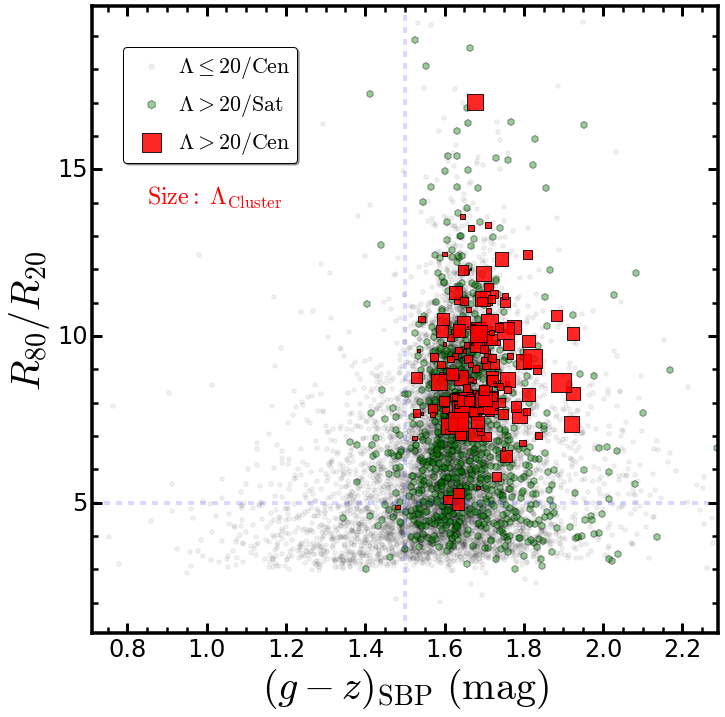

In [329]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaTab['gz_kC'], gamaTab['c82_120'], s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memTab['gz_kC'], memTab['c82_120'], s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgTab['gz_kC'], bcgTab['c82_120'], marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$(g-z)_{\mathrm{SBP}}\ (\mathrm{mag})$', size=40)
ax1.set_ylabel('${R_{80}}/{R_{20}}$', size=40)
# Axis limits
ax1.set_xlim(0.71, 2.29)
ax1.set_ylim(1.1, 19.89)

ax1.legend(loc=(0.05, 0.75), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.85, 14.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

ax1.axvline(1.5, c='b', alpha=0.15, linestyle='--', linewidth=4.0)
ax1.axhline(5.0, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

fig.savefig('../figure/hscMassive_gz_c82.png', dpi=230)

# Mass - Size Relation 

In [12]:
bcgClean = bcgTab[(bcgTab['m100_c'] >= 10.0) & 
                  (bcgTab['c82_120'] <= 14.0)]
print(len(bcgClean))

gamaClean = gamaTab[(gamaTab['c82_120'] >= 5.0) & 
                    (gamaTab['c82_120'] <= 14.0) &
                    (gamaTab['gz_kC'] >= 1.6) &
                    (gamaTab['ur_rest_sed'] >= 2.0) & 
                    (gamaTab['m100_c'] >= 10.0)]

print(len(gamaClean))

memClean = memTab[(memTab['c82_120'] >= 5.0) &
                  (memTab['c82_120'] <= 14.0) &
                  (memTab['gz_kC'] >= 1.5) &
                  (memTab['ur_rest_sed'] >= 1.9) & 
                  (memTab['m100_c'] >= 10.0)]

print(len(memClean))

174
3419
262


/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in greater_equal


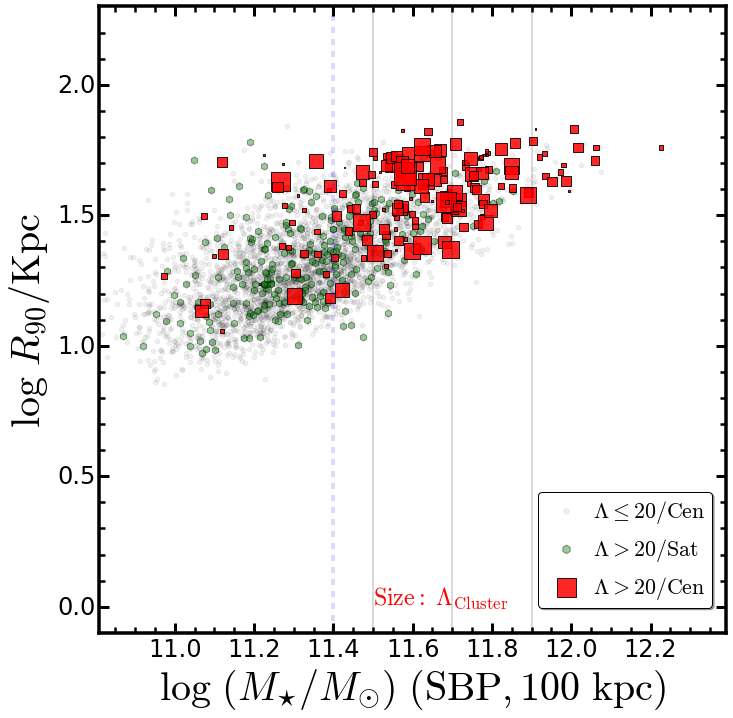

In [26]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter(gamaClean['m100_c'], np.log10(gamaClean['r90_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memClean['m100_c'], np.log10(memClean['r90_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgClean['m100_c'], np.log10(bcgClean['r90_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\log\ {R_{90}/\mathrm{Kpc}}$', size=40)
# Axis limits
ax1.set_xlim(10.81, 12.39)
ax1.set_ylim(-0.1, 2.3)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.50, 0.01, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_logm_r90.png', dpi=230)

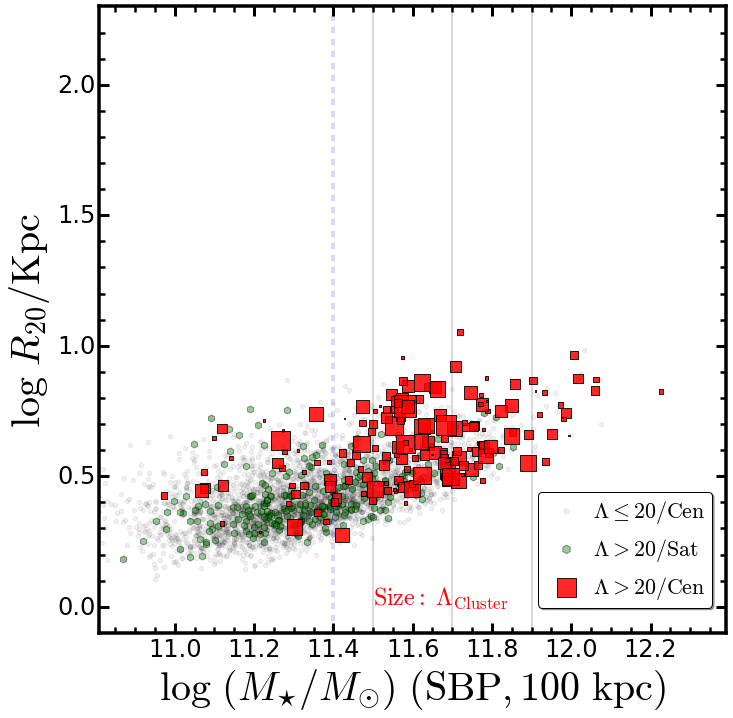

In [27]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter(gamaClean['m100_c'], np.log10(gamaClean['r20_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memClean['m100_c'], np.log10(memClean['r20_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgClean['m100_c'], np.log10(bcgClean['r20_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\log\ {R_{20}/\mathrm{Kpc}}$', size=40)
# Axis limits
ax1.set_xlim(10.81, 12.39)
ax1.set_ylim(-0.1, 2.3)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.50, 0.01, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_logm_r20.png', dpi=230)

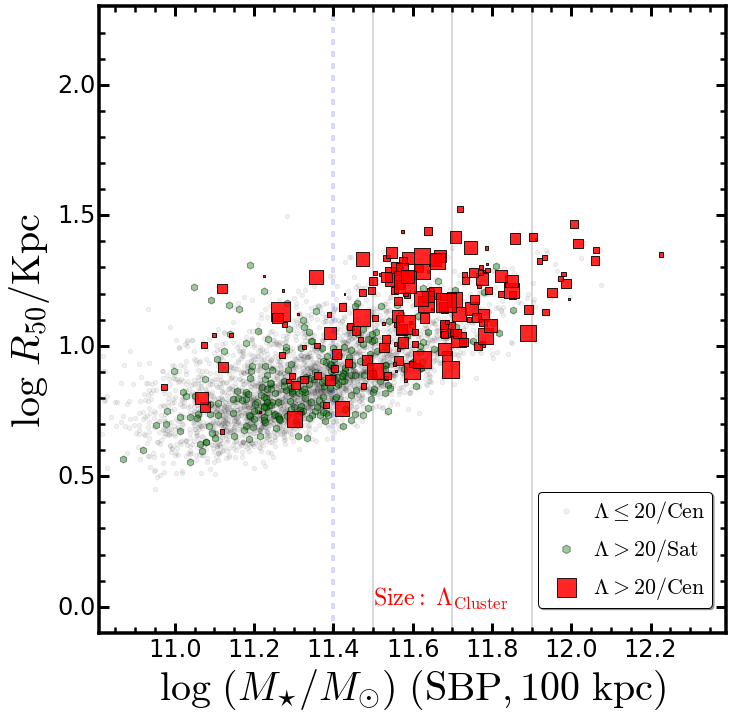

In [28]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter(gamaClean['m100_c'], np.log10(gamaClean['r50_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memClean['m100_c'], np.log10(memClean['r50_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgClean['m100_c'], np.log10(bcgClean['r50_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$\log\ {R_{50}/\mathrm{Kpc}}$', size=40)
# Axis limits
ax1.set_xlim(10.81, 12.39)
ax1.set_ylim(-0.1, 2.3)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.50, 0.01, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()
fig.savefig('../figure/hscMassive_logm_r50.png', dpi=230)

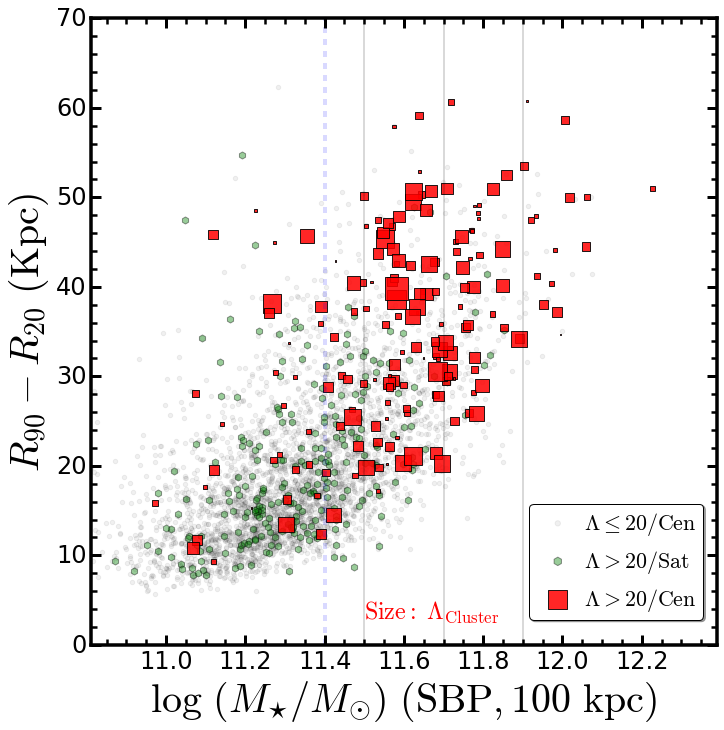

In [32]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter(gamaClean['m100_c'], (gamaClean['r90_120'] - gamaClean['r20_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memClean['m100_c'], (memClean['r90_120'] - memClean['r20_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgClean['m100_c'], (bcgClean['r90_120'] - bcgClean['r20_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$R_{90}-R_{20}\ (\mathrm{Kpc})$', size=40)
# Axis limits
ax1.set_xlim(10.81, 12.39)
#ax1.set_ylim(-0.1, 2.3)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.50, 3.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_logm_r90-r20.png', dpi=230)

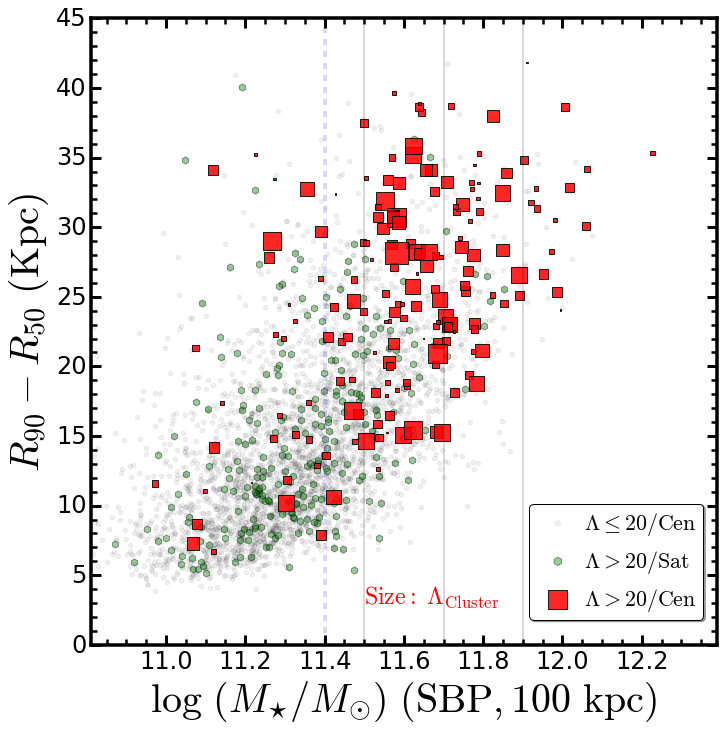

In [33]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter(gamaClean['m100_c'], (gamaClean['r90_120'] - gamaClean['r50_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter(memClean['m100_c'], (memClean['r90_120'] - memClean['r50_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter(bcgClean['m100_c'], (bcgClean['r90_120'] - bcgClean['r50_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\star}/M_{\odot})\ (\mathrm{SBP}, 100\ \mathrm{kpc})$', size=40)
ax1.set_ylabel('$R_{90}-R_{50}\ (\mathrm{Kpc})$', size=40)
# Axis limits
ax1.set_xlim(10.81, 12.39)
#ax1.set_ylim(-0.1, 2.3)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(11.50, 3.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_logm_r90-r50.png', dpi=230)

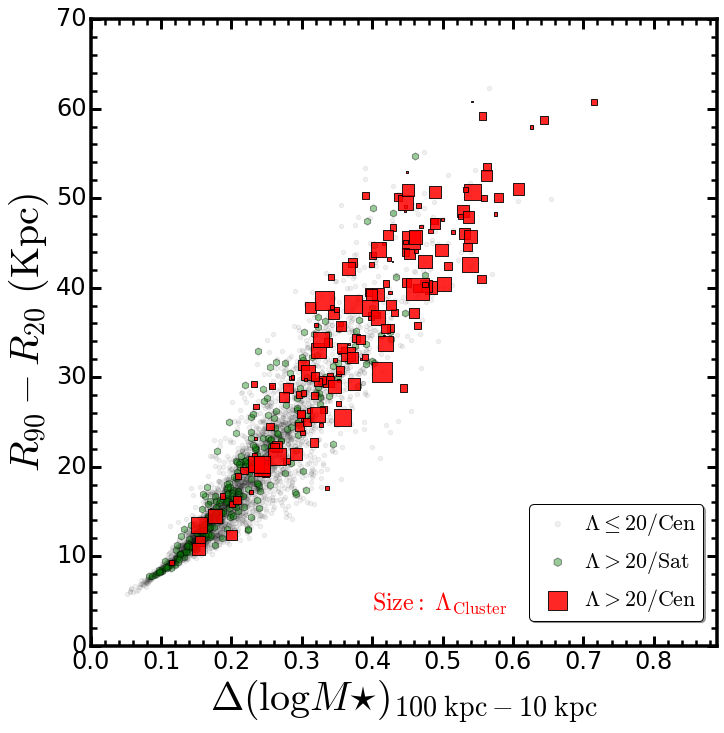

In [46]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter((gamaClean['m100_c'] - gamaClean['m10_c']), 
            (gamaClean['r90_120'] - gamaClean['r20_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter((memClean['m100_c'] - memClean['m10_c']), 
            (memClean['r90_120'] - memClean['r20_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter((bcgClean['m100_c'] - bcgClean['m10_c']), 
            (bcgClean['r90_120'] - bcgClean['r20_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\Delta(\log M{\star})_{\mathrm{100\ kpc}-\mathrm{10\ kpc}}$', 
               size=40)
ax1.set_ylabel('$R_{90}-R_{20}\ (\mathrm{Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.0, 0.89)
#ax1.set_ylim(-0.1, 2.3)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

ax1.text(0.40, 4.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_m100-m10_r90-r20.png', dpi=230)

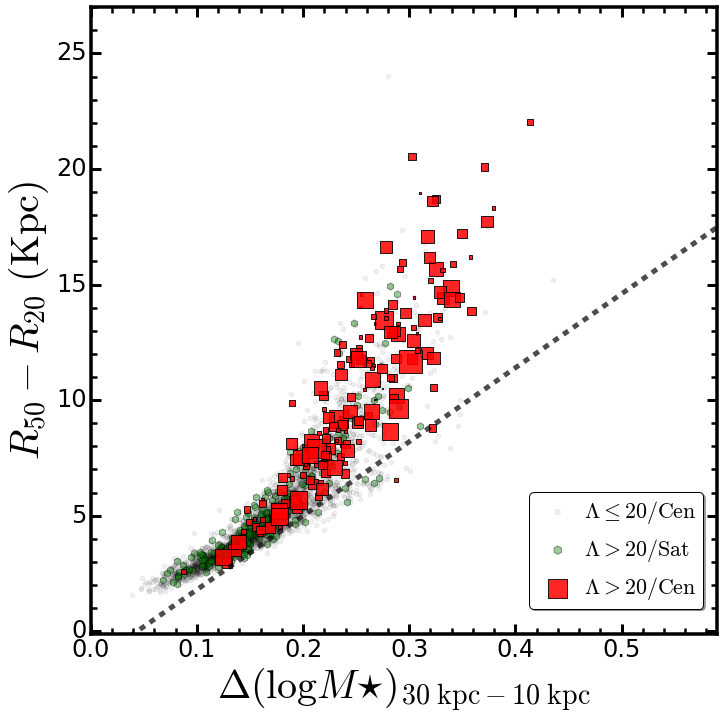

In [72]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter((gamaClean['m30_c'] - gamaClean['m10_c']), 
            (gamaClean['r50_120'] - gamaClean['r20_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter((memClean['m30_c'] - memClean['m10_c']), 
            (memClean['r50_120'] - memClean['r20_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter((bcgClean['m30_c'] - bcgClean['m10_c']), 
            (bcgClean['r50_120'] - bcgClean['r20_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\Delta(\log M{\star})_{\mathrm{30\ kpc}-\mathrm{10\ kpc}}$', 
               size=40)
ax1.set_ylabel('$R_{50}-R_{20}\ (\mathrm{Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.0, 0.59)
ax1.set_ylim(-0.1, 27.0)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

## Separate the ETGs and LTGs 
xx = np.arange(0.0, 1.0, 0.01)
ax1.plot(xx, (32.0 * xx - 1.4), linestyle='--', linewidth=5.0, c='k',
         alpha=0.7)

#ax1.text(0.40, 4.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
#         fontsize=24, color='r')

plt.show()

#fig.savefig('../figure/hscMassive_m30-m10_r50-r20.png', dpi=230)

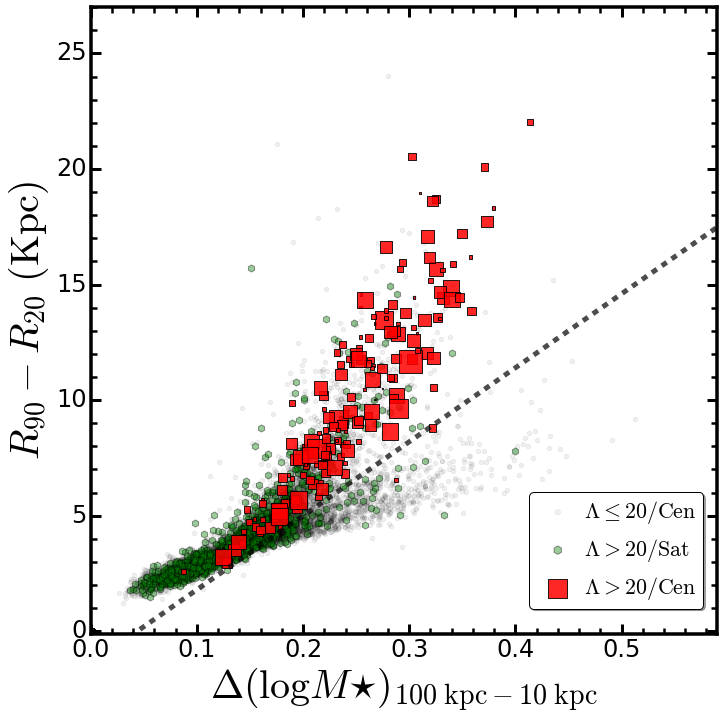

In [70]:
fig = plt.figure(figsize=(10, 10))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.125, 0.12, 0.87, 0.87]
ax1 = plt.axes(rec)

# ---------------------------------------------------------------------------
# Scatter plot

ax1.axvline(11.4, c='b', alpha=0.15, linestyle='--', linewidth=4.0)

ax1.axvline(11.5, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.7, c='k', alpha=0.15, linestyle='-', linewidth=2.0)
ax1.axvline(11.9, c='k', alpha=0.15, linestyle='-', linewidth=2.0)

# Matched ones 
ax1.scatter((gamaTab['m30_c'] - gamaTab['m10_c']), 
            (gamaTab['r50_120'] - gamaTab['r20_120']), s=20.0, 
            alpha=0.06, c='k', label='$\Lambda \leq 20\mathrm{/Cen}$')

ax1.scatter((memTab['m30_c'] - memTab['m10_c']), 
            (memTab['r50_120'] - memTab['r20_120']), s=50.0, marker='h', 
            alpha=0.40, c='g', label='$\Lambda > 20\mathrm{/Sat}$')

ax1.scatter((bcgClean['m30_c'] - bcgClean['m10_c']), 
            (bcgClean['r50_120'] - bcgClean['r20_120']), marker='s', 
            alpha=0.85, c='r', label='$\Lambda > 20\mathrm{/Cen}$', 
            s=((bcgTab['LAMBDA_CLUSTER'] - 20) * 5))

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\Delta(\log M{\star})_{\mathrm{100\ kpc}-\mathrm{10\ kpc}}$', 
               size=40)
ax1.set_ylabel('$R_{90}-R_{20}\ (\mathrm{Kpc})$', size=40)
# Axis limits
ax1.set_xlim(0.0, 0.59)
ax1.set_ylim(-0.1, 27.0)

ax1.legend(loc=(0.70, 0.04), shadow=True, fancybox=True, 
           numpoints=1, fontsize=22, scatterpoints=1, 
           markerscale=1.2, borderpad=0.3, handletextpad=0.2)

## Separate the ETGs and LTGs 
xx = np.arange(0.0, 1.0, 0.01)
ax1.plot(xx, (32.0 * xx - 1.4), linestyle='--', linewidth=5.0, c='k',
         alpha=0.7)

#ax1.text(0.40, 4.0, '$\mathrm{Size:}\ {\Lambda}_{\mathrm{Cluster}}$',
#         fontsize=24, color='r')

plt.show()

fig.savefig('../figure/hscMassive_m30-m10_r50-r20_all.png', dpi=230)